## 데이터 전처리하기

In [1]:
# 주의! ray를 tensorflow보다 먼저 import하면 오류가 발생할 수 있습니다
import io, json, os, math

import tensorflow as tf
from tensorflow.keras.layers import Add, Concatenate, Lambda
from tensorflow.keras.layers import Input, Conv2D, ReLU, MaxPool2D
from tensorflow.keras.layers import UpSampling2D, ZeroPadding2D
from tensorflow.keras.layers import BatchNormalization
import ray

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

PROJECT_PATH = os.getenv('HOME') + '/aiffel/mpii'
IMAGE_PATH = os.path.join(PROJECT_PATH, 'images')
SMODEL_PATH = os.path.join(PROJECT_PATH, 'smodel')
MODEL_PATH = os.path.join(PROJECT_PATH, 'model')
MODELS_PATH = os.path.join(PROJECT_PATH, 'models')
TFRECORD_PATH = os.path.join(PROJECT_PATH, 'tfrecords_mpii')
TRAIN_JSON = os.path.join(PROJECT_PATH, 'mpii_human_pose_v1_u12_2', 'train.json')
VALID_JSON = os.path.join(PROJECT_PATH, 'mpii_human_pose_v1_u12_2', 'validation.json')

print('슝=3')

슝=3


In [2]:
with open(TRAIN_JSON) as train_json:  # 학습 데이터 JSON 파일을 열기
    train_annos = json.load(train_json)  # JSON 파일 내용을 Python 객체로 로드
    json_formatted_str = json.dumps(train_annos[0], indent=2)  # 첫 번째 항목을 보기 좋은 형식으로 변환
    print(json_formatted_str)  # 변환된 JSON 출력


{
  "joints_vis": [
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1
  ],
  "joints": [
    [
      620.0,
      394.0
    ],
    [
      616.0,
      269.0
    ],
    [
      573.0,
      185.0
    ],
    [
      647.0,
      188.0
    ],
    [
      661.0,
      221.0
    ],
    [
      656.0,
      231.0
    ],
    [
      610.0,
      187.0
    ],
    [
      647.0,
      176.0
    ],
    [
      637.0201,
      189.8183
    ],
    [
      695.9799,
      108.1817
    ],
    [
      606.0,
      217.0
    ],
    [
      553.0,
      161.0
    ],
    [
      601.0,
      167.0
    ],
    [
      692.0,
      185.0
    ],
    [
      693.0,
      240.0
    ],
    [
      688.0,
      313.0
    ]
  ],
  "image": "015601864.jpg",
  "scale": 3.021046,
  "center": [
    594.0,
    257.0
  ]
}


## 포즈 추정 JSON 데이터 설명

제공된 JSON 데이터는 특정 이미지에 대한 **사람의 자세(annotation)**를 나타냅니다. 각 필드에 대한 상세한 설명은 아래와 같습니다.

---

### JSON 구조

#### 1. `"joints_vis"`
- **내용**: `[1, 1, 1, ...]` (16개의 값)
- **의미**:
  - 각 관절의 가시성(`1`은 보임, `0`은 보이지 않음)을 나타냅니다.
  - 예: 이 데이터에서는 모든 관절이 보이는 상태입니다(`1`).

---

#### 2. `"joints"`
- **내용**:
  ```json
  [
    [620.0, 394.0],
    [616.0, 269.0],
    ...
  ]
- **의미**:
    - 각 관절의 좌표를 `[x, y]` 형식으로 나타냅니다.
    - 총 16개의 관절 좌표가 포함되어 있습니다.
    - 예:
        - 첫 번째 관절: `(620.0, 394.0)`
        - 두 번째 관절: `(616.0, 269.0)`
        - 세 번째 관절: `(573.0, 185.0)`

---

#### 3. `"image"`

- **내용**: `"015601864.jpg"`
- **의미**:
    - 관절 데이터와 연결된 이미지 파일 이름입니다.

---

#### 4. `"scale"`

- **내용**: `3.021046`
- **의미**:
    - 이미지 크기 조정을 위한 스케일 값을 나타냅니다.
    - 원본 이미지 대비 현재 크기의 비율입니다.

In [3]:
# 단일 포즈 주석 데이터를 구조화된 딕셔너리로 파싱하는 함수
# 이 함수는 JSON 형식의 포즈 주석 데이터에서 파일 경로, 관절 좌표, 
# 가시성, 중심점, 스케일 정보를 추출하고 정리합니다.
def parse_one_annotation(anno, image_dir):
    filename = anno['image']  # 이미지 파일 이름 가져오기
    joints = anno['joints']  # 관절 좌표 데이터 가져오기
    joints_visibility = anno['joints_vis']  # 관절 가시성 데이터 가져오기
    
    # 주석 데이터를 정리하여 딕셔너리로 저장
    annotation = {
        'filename': filename,  # 이미지 파일 이름
        'filepath': os.path.join(image_dir, filename),  # 이미지 파일 경로
        'joints_visibility': joints_visibility,  # 관절 가시성 데이터
        'joints': joints,  # 관절 좌표 데이터
        'center': anno['center'],  # 이미지 중심 좌표
        'scale': anno['scale']  # 이미지 스케일 정보
    }
    
    # 정리된 주석 데이터 반환
    return annotation

print('슝=3')  # 함수 정의 완료를 알리는 출력


슝=3


In [4]:
# JSON 파일에서 데이터를 읽어 첫 번째 주석(annotation)을 파싱하고 출력하는 코드


with open(TRAIN_JSON) as train_json:  # TRAIN_JSON 경로의 JSON 파일 열기
    train_annos = json.load(train_json)  # JSON 파일 데이터를 Python 객체로 변환
    
    # 첫 번째 주석 데이터를 파싱하여 딕셔너리 형태로 변환
    test = parse_one_annotation(train_annos[0], IMAGE_PATH)
    
    # 변환된 딕셔너리 출력
    print(test)


{'filename': '015601864.jpg', 'filepath': '/aiffel/aiffel/mpii/images/015601864.jpg', 'joints_visibility': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'joints': [[620.0, 394.0], [616.0, 269.0], [573.0, 185.0], [647.0, 188.0], [661.0, 221.0], [656.0, 231.0], [610.0, 187.0], [647.0, 176.0], [637.0201, 189.8183], [695.9799, 108.1817], [606.0, 217.0], [553.0, 161.0], [601.0, 167.0], [692.0, 185.0], [693.0, 240.0], [688.0, 313.0]], 'center': [594.0, 257.0], 'scale': 3.021046}


### TFRecord 파일 만들기

**TFRecord**는 TensorFlow에서 데이터셋을 저장하고 사용할 때 효율적으로 관리하기 위해 제공하는 **이진(binary) 데이터 형식**입니다. 대규모 데이터셋을 저장하고 처리하는 데 적합하며, 모델 학습 및 추론 시 데이터 입출력 속도를 최적화합니다.

#### **특징**

1. **효율성**:
    
    - 이진 파일 형식으로 저장되므로 저장 공간이 절약됩니다.
    - 읽기/쓰기 속도가 빠릅니다.
2. **유연성**:
    
    - 구조화된 데이터를 저장할 수 있습니다.
    - 텍스트, 이미지, 오디오, 비디오 등 다양한 데이터를 저장 가능합니다.
3. **분산 학습 지원**:
    
    - 분산 학습 환경에서 데이터를 효율적으로 읽어오기 위한 최적화가 되어 있습니다.
4. **TensorFlow 전용 API 제공**:
    
    - TensorFlow에서 데이터를 쉽게 읽고 처리할 수 있도록 `tf.data.TFRecordDataset` API를 제공합니다.

In [5]:
# JSON 주석 데이터를 TFRecord Example로 변환하는 함수
# - 이 함수는 이미지와 주석 데이터를 활용하여 TFRecord 형식에 맞는 Example 객체를 생성합니다.
# - JPEG 변환, 이미지 크기 및 관절 데이터 처리, TFRecord Feature 생성 작업을 수행합니다.

def generate_tfexample(anno):
    # byte 인코딩을 위한 함수 정의
    def _bytes_feature(value):
        if isinstance(value, type(tf.constant(0))):  # TensorFlow 텐서를 처리
            value = value.numpy()
        return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))
    
    # 파일 이름 및 경로 가져오기
    filename = anno['filename']
    filepath = anno['filepath']
    
    # 이미지 파일 읽기
    with open(filepath, 'rb') as image_file:
        content = image_file.read()
    
    # 이미지를 열고 JPEG 포맷 및 RGB 모드 확인
    image = Image.open(filepath)
    if image.format != 'JPEG' or image.mode != 'RGB':
        # JPEG 및 RGB로 변환
        image_rgb = image.convert('RGB')
        with io.BytesIO() as output:
            image_rgb.save(output, format="JPEG", quality=95)
            content = output.getvalue()
    
    # 이미지 크기 및 채널 수 확인
    width, height = image.size
    depth = 3  # RGB 이미지의 채널 수

    # 중심 좌표 및 스케일
    c_x = int(anno['center'][0])
    c_y = int(anno['center'][1])
    scale = anno['scale']

    # 관절 좌표 처리 (x, y)
    x = [int(joint[0]) if joint[0] >= 0 else int(joint[0]) for joint in anno['joints']]
    y = [int(joint[1]) if joint[1] >= 0 else int(joint[1]) for joint in anno['joints']]

    # 가시성 데이터 처리 (0 -> 0, 나머지 -> 2)
    v = [0 if joint_v == 0 else 2 for joint_v in anno['joints_visibility']]
    
    # TFRecord Feature 생성
    feature = {
        'image/height': tf.train.Feature(int64_list=tf.train.Int64List(value=[height])),
        'image/width': tf.train.Feature(int64_list=tf.train.Int64List(value=[width])),
        'image/depth': tf.train.Feature(int64_list=tf.train.Int64List(value=[depth])),
        'image/object/parts/x': tf.train.Feature(int64_list=tf.train.Int64List(value=x)),
        'image/object/parts/y': tf.train.Feature(int64_list=tf.train.Int64List(value=y)),
        'image/object/center/x': tf.train.Feature(int64_list=tf.train.Int64List(value=[c_x])),
        'image/object/center/y': tf.train.Feature(int64_list=tf.train.Int64List(value=[c_y])),
        'image/object/scale': tf.train.Feature(float_list=tf.train.FloatList(value=[scale])),
        'image/object/parts/v': tf.train.Feature(int64_list=tf.train.Int64List(value=v)),
        'image/encoded': _bytes_feature(content),
        'image/filename': _bytes_feature(filename.encode())
    }
    
    # TFRecord Example 생성
    return tf.train.Example(features=tf.train.Features(feature=feature))



### 얼마나 많은 TFRecord를 만들지 결정할 함수 만들기
- 이 함수는 전체 데이터를 몇 개의 그룹으로 나눌지 결정해 줍니다. 
- 전체 데이터 l을 n그룹으로 나눕니다. 
- 결과적으로 n개의 TFRecord 파일을 만듬.


In [6]:
# 리스트를 지정된 개수로 균등하게 분할하는 함수
# - 이 함수는 리스트를 n개의 하위 리스트로 나눕니다.
# - 각 하위 리스트는 원래 리스트의 요소를 균등하게 포함하려고 시도합니다.

def chunkify(l, n):
    size = len(l) // n  # 각 하위 리스트의 기본 크기 계산
    start = 0           # 분할 시작 인덱스 초기화
    results = []        # 분할된 하위 리스트를 저장할 결과 리스트
    
    for i in range(n):  # n개의 하위 리스트를 생성
        results.append(l[start:start + size])  # 하위 리스트 생성 및 추가
        start += size  # 다음 분할 시작점 업데이트
    
    return results  # 분할 결과 반환




In [7]:
# 테스트: chunkify 함수로 리스트를 분할한 결과를 출력
# - [0] * 1000: 길이가 1000인 0으로 채워진 리스트를 생성
# - 64개로 분할하여 결과를 확인(0이 1000개 들어 있는 리스트가 64개 만듬)

test_chunks = chunkify([0] * 1000, 64)  # 리스트를 64개로 분할
print(test_chunks)  # 분할된 하위 리스트 출력
print(len(test_chunks))  # 생성된 하위 리스트의 개수 출력
print(len(test_chunks[0]))  # 첫 번째 하위 리스트의 길이 출력


[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0,

In [8]:
# Ray를 활용하여 TFRecord 파일을 병렬로 생성하는 함수
# - 이 함수는 입력된 데이터 청크(chunk)를 처리하여 TFRecord 파일을 생성합니다.
# - 병렬 처리를 위해 Ray의 remote 데코레이터(@ray.remote)를 사용합니다.

@ray.remote
def build_single_tfrecord(chunk, path):
    print('start to build tf records for ' + path)  # TFRecord 생성 시작 로그

    # TFRecord 파일 작성
    with tf.io.TFRecordWriter(path) as writer:
        for anno in chunk:  # 청크 내 각 주석(annotation) 처리
            tf_example = generate_tfexample(anno)  # TFRecord Example 생성
            writer.write(tf_example.SerializeToString())  # TFRecord 파일에 쓰기

    print('finished building tf records for ' + path)  # TFRecord 생성 완료 로그



In [9]:
# 주석 데이터를 분할하고 병렬로 TFRecord 파일을 생성하는 함수
# - 이 함수는 전체 주석 데이터를 총 `total_shards`만큼 분할한 후,
#   Ray를 활용하여 각 청크를 병렬 처리로 TFRecord 파일로 변환합니다.

def build_tf_records(annotations, total_shards, split):
    # 주석 데이터를 총 total_shards 개수로 분할
    chunks = chunkify(annotations, total_shards)
    
    # 각 청크에 대해 TFRecord 파일 생성 작업을 병렬 실행
    futures = [
        build_single_tfrecord.remote(
            chunk,  # 청크 데이터
            '{}/{}_{}_of_{}.tfrecords'.format(  # TFRecord 파일 경로 생성
                TFRECORD_PATH,  # 저장할 경로
                split,          # 데이터 세트 이름 (예: train, validation)
                str(i + 1).zfill(4),  # 파일 번호 (예: 0001)
                str(total_shards).zfill(4),  # 총 파일 수 (예: 0100)
            )
        ) 
        for i, chunk in enumerate(chunks)  # 청크를 인덱스와 함께 반복
    ]

    # 병렬로 실행된 작업이 완료될 때까지 대기
    ray.get(futures)




## Ray를 사용한 분산 처리

큰 작업을 작은 단위로 나누어 여러 컴퓨터나 CPU 코어에서 동시에 실행. 

Ray는 이러한 작업을 쉽게 관리하고 실행할 수 있도록 도와주는 도구. 

복잡한 네트워킹 코드를 작성하지 않고도 병렬 및 분산 처리를 구현.


### Ray의 특징

1. 병렬 및 분산 처리:
   - @ray.remote로 함수나 클래스를 병렬로 실행.
   - 단일 머신부터 클러스터 환경까지 확장 가능.

2. 확장성:
   - 대규모 데이터 처리와 클러스터 기반 작업 지원.
   - 수천 개의 태스크와 노드 관리 가능.

3. 상태 유지:
   - Actor를 사용해 작업 간 상태를 유지하고 공유 가능.

4. GPU 및 리소스 관리:
   - GPU를 활용한 딥러닝 모델 학습 등 고성능 작업 지원.
   - 작업별로 CPU/GPU 리소스 제한 설정 가능.

5. 간단한 데이터 공유:
   - Object Store를 통해 태스크 간 데이터를 효율적으로 공유.

6. 유연한 API:
   - 동적 태스크 생성, 동기화, 분산 데이터 처리를 위한 다양한 API 제공.

7. 사용 사례:
   - 머신러닝, 대규모 데이터 처리, 분산 학습, 시뮬레이션 등.

Ray는 간단하고 강력한 분산/병렬 처리 Python 도구입니다.


### **차이점: Multiprocessing vs. Ray**

|**특징**|**Multiprocessing**|**Ray**|
|---|---|---|
|**주 목적**|단일 머신에서 여러 프로세스를 병렬 실행하기 위한 표준 Python 라이브러리.|분산 및 병렬 컴퓨팅을 위한 고성능 프레임워크로, 단일 머신 및 클러스터 환경 모두 지원.|
|**구현 복잡도**|간단하고 Python 표준 라이브러리로 제공되므로 추가 설치가 불필요.|더 강력한 기능 제공, 그러나 사용법은 약간 더 복잡하며 추가 설치(`pip install ray`)가 필요.|
|**분산 지원**|단일 머신에서만 작동(분산 처리가 필요할 경우 외부 라이브러리와 통합 필요).|단일 머신뿐 아니라 클러스터 환경에서 분산 처리를 기본적으로 지원.|
|**병렬 처리 단위**|**프로세스(Process)**: 각 작업은 독립적인 Python 프로세스로 실행.|**태스크(Task)** 및 **액터(Actor)**: 작업 단위를 유연하게 구성 가능하며, 상태를 유지하는 액터를 사용할 수 있음.|
|**상태 유지**|상태 유지가 어렵고, 프로세스 간에 데이터를 공유하려면 Queue나 Pipe 같은 도구 사용 필요.|상태를 유지하는 **Actor**를 제공하여 태스크 간 상태 공유를 간편하게 처리 가능.|
|**확장성**|단일 머신에서 CPU 코어 수에 따라 병렬 처리 가능.|클러스터 및 분산 환경에서 수백~수천 개의 노드에 걸친 확장 가능.|
|**오버헤드**|프로세스를 생성하고 종료하는 데 오버헤드가 발생하며, 특히 많은 수의 작업을 처리할 때 비효율적.|경량화된 태스크 스케줄링으로 대규모 병렬 작업을 더 효율적으로 처리.|
|**유연성**|Python 표준 라이브러리로 간단한 병렬 작업에 적합하지만, 고급 기능(예: 동적 작업 스케줄링, 클러스터 관리) 부족.|고급 기능(예: 동적 태스크 생성, 리소스 제한, GPU 관리, 분산 데이터 처리)을 기본 제공.|
|**데이터 공유 방식**|데이터를 공유하려면 `Queue`, `Pipe`, 또는 `shared_memory`와 같은 명시적인 메커니즘 필요.|Ray의 **Object Store**를 사용해 태스크 간 데이터를 효율적으로 공유 가능.|
|**사용 사례**|CPU 집약적인 작업(예: 대규모 연산, 데이터 파싱 등)이나 단순한 병렬 처리.|복잡한 병렬 처리, 상태 공유, 클러스터 환경에서의 대규모 분산 처리, GPU 관리 등이 필요한 경우.|


In [10]:
# TFRecord 파일 생성 파이프라인
# - 주석 데이터를 파싱하고, 학습 및 검증 데이터를 나누어 병렬로 TFRecord 파일을 생성합니다.
# - 학습 데이터는 64개 파일로, 검증 데이터는 8개 파일로 나뉩니다.

num_train_shards = 64  # 학습 데이터 분할 개수
num_val_shards = 8     # 검증 데이터 분할 개수

# Ray 초기화
ray.init()

print('Start to parse annotations.')

# TFRecord 디렉토리가 없는 경우 생성
if not os.path.exists(TFRECORD_PATH):
    os.makedirs(TFRECORD_PATH)

# 학습 데이터 주석 파싱
with open(TRAIN_JSON) as train_json:
    train_annos = json.load(train_json)  # 학습 주석 데이터 로드
    train_annotations = [
        parse_one_annotation(anno, IMAGE_PATH)  # 주석 데이터를 딕셔너리로 변환
        for anno in train_annos
    ]
    print('First train annotation: ', train_annotations[0])  # 첫 번째 학습 주석 출력

# 검증 데이터 주석 파싱
with open(VALID_JSON) as val_json:
    val_annos = json.load(val_json)  # 검증 주석 데이터 로드
    val_annotations = [
        parse_one_annotation(anno, IMAGE_PATH)  # 주석 데이터를 딕셔너리로 변환
        for anno in val_annos
    ]
    print('First val annotation: ', val_annotations[0])  # 첫 번째 검증 주석 출력

print('Start to build TF Records.')

# 학습 데이터 TFRecord 생성
build_tf_records(train_annotations, num_train_shards, 'train')

# 검증 데이터 TFRecord 생성
build_tf_records(val_annotations, num_val_shards, 'val')

# 생성된 TFRecord 파일 정보 출력
print('Successfully wrote {} annotations to TF Records.'.format(
    len(train_annotations) + len(val_annotations)
))


2025-01-05 17:40:31,443	WARNING services.py:1729 -- WARNING: The object store is using /tmp instead of /dev/shm because /dev/shm has only 67108864 bytes available. This will harm performance! You may be able to free up space by deleting files in /dev/shm. If you are inside a Docker container, you can increase /dev/shm size by passing '--shm-size=3.65gb' to 'docker run' (or add it to the run_options list in a Ray cluster config). Make sure to set this to more than 30% of available RAM.


Start to parse annotations.
First train annotation:  {'filename': '015601864.jpg', 'filepath': '/aiffel/aiffel/mpii/images/015601864.jpg', 'joints_visibility': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'joints': [[620.0, 394.0], [616.0, 269.0], [573.0, 185.0], [647.0, 188.0], [661.0, 221.0], [656.0, 231.0], [610.0, 187.0], [647.0, 176.0], [637.0201, 189.8183], [695.9799, 108.1817], [606.0, 217.0], [553.0, 161.0], [601.0, 167.0], [692.0, 185.0], [693.0, 240.0], [688.0, 313.0]], 'center': [594.0, 257.0], 'scale': 3.021046}
First val annotation:  {'filename': '005808361.jpg', 'filepath': '/aiffel/aiffel/mpii/images/005808361.jpg', 'joints_visibility': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'joints': [[804.0, 711.0], [816.0, 510.0], [908.0, 438.0], [1040.0, 454.0], [906.0, 528.0], [883.0, 707.0], [974.0, 446.0], [985.0, 253.0], [982.7591, 235.9694], [962.2409, 80.0306], [869.0, 214.0], [798.0, 340.0], [902.0, 253.0], [1067.0, 253.0], [1167.0, 353.0], [1142.0, 478.0]], 'c

## 23-5. data label 로 만들기

- TFRecord로 저장된 데이터를 모델 학습에 필요한 데이터로 바꿔줄 함수가 필요
- tensorflow에서 이미 제공해주는 함수를 사용
- TFRecord가 직렬화된 데이터이기 때문에 만들 때 데이터 순서와 읽어올 때 데이터 순서가 같아야 함
- 데이터의 형식도 동일하게 맞춰 줘야 합니다.

In [11]:
# TFRecord Example을 파싱하여 Feature를 추출하는 함수
# - 이 함수는 TFRecord에서 저장된 데이터 구조를 해석하고, 지정된 Feature를 추출합니다.

def parse_tfexample(example):
    # TFRecord Feature 구조 정의
    image_feature_description = {
        'image/height': tf.io.FixedLenFeature([], tf.int64),  # 이미지 높이
        'image/width': tf.io.FixedLenFeature([], tf.int64),   # 이미지 너비
        'image/depth': tf.io.FixedLenFeature([], tf.int64),   # 이미지 채널 수
        'image/object/parts/x': tf.io.VarLenFeature(tf.int64),  # 관절 x 좌표
        'image/object/parts/y': tf.io.VarLenFeature(tf.int64),  # 관절 y 좌표
        'image/object/parts/v': tf.io.VarLenFeature(tf.int64),  # 관절 가시성
        'image/object/center/x': tf.io.FixedLenFeature([], tf.int64),  # 이미지 중심 x 좌표
        'image/object/center/y': tf.io.FixedLenFeature([], tf.int64),  # 이미지 중심 y 좌표
        'image/object/scale': tf.io.FixedLenFeature([], tf.float32),  # 이미지 스케일 값
        'image/encoded': tf.io.FixedLenFeature([], tf.string),  # 인코딩된 이미지 데이터
        'image/filename': tf.io.FixedLenFeature([], tf.string),  # 이미지 파일 이름
    }
    # TFRecord에서 단일 Example 파싱
    return tf.io.parse_single_example(example, image_feature_description)




(build_single_tfrecord pid=433) finished building tf records for /aiffel/aiffel/mpii/tfrecords_mpii/val_0008_of_0008.tfrecords


### image 와 label 을 이용해서 적절한 학습 형태로 변환(정사각형으로 crop하여 사용)

In [12]:
# 이미지를 주어진 키포인트와 중심점을 기준으로 잘라내는 함수
# - 이 함수는 사람의 키포인트를 포함하는 관심 영역(ROI)을 추출합니다.
# - 잘라낸 이미지와 재조정된 키포인트 좌표를 반환합니다.

def crop_roi(image, features, margin=0.2):
    # 이미지의 높이, 너비, 채널 크기 가져오기
    img_shape = tf.shape(image)
    img_height = img_shape[0]
    img_width = img_shape[1]
    img_depth = img_shape[2]

    # 키포인트 좌표(x, y)를 밀도가 높은 형태로 변환 및 정수형으로 캐스팅
    keypoint_x = tf.cast(tf.sparse.to_dense(features['image/object/parts/x']), dtype=tf.int32)
    keypoint_y = tf.cast(tf.sparse.to_dense(features['image/object/parts/y']), dtype=tf.int32)

    # 중심점 및 신체 높이 정보 가져오기
    center_x = features['image/object/center/x']
    center_y = features['image/object/center/y']
    body_height = features['image/object/scale'] * 200.0

    # 유효한 키포인트(값이 0보다 큰)만 필터링
    masked_keypoint_x = tf.boolean_mask(keypoint_x, keypoint_x > 0)
    masked_keypoint_y = tf.boolean_mask(keypoint_y, keypoint_y > 0)

    # 키포인트의 최소/최대값 계산
    keypoint_xmin = tf.reduce_min(masked_keypoint_x)
    keypoint_xmax = tf.reduce_max(masked_keypoint_x)
    keypoint_ymin = tf.reduce_min(masked_keypoint_y)
    keypoint_ymax = tf.reduce_max(masked_keypoint_y)

    # ROI를 정사각형으로 만들기 위해 마진을 고려하여 좌표 조정
    xmin = keypoint_xmin - tf.cast(body_height * margin, dtype=tf.int32)
    xmax = keypoint_xmax + tf.cast(body_height * margin, dtype=tf.int32)
    ymin = keypoint_ymin - tf.cast(body_height * margin, dtype=tf.int32)
    ymax = keypoint_ymax + tf.cast(body_height * margin, dtype=tf.int32)

    # 이미지 크기를 벗어나지 않도록 좌표를 제한
    effective_xmin = xmin if xmin > 0 else 0
    effective_ymin = ymin if ymin > 0 else 0
    effective_xmax = xmax if xmax < img_width else img_width
    effective_ymax = ymax if ymax < img_height else img_height

    # 잘라낸 영역의 크기 계산
    effective_height = effective_ymax - effective_ymin
    effective_width = effective_xmax - effective_xmin

    # 이미지 크롭
    image = image[effective_ymin:effective_ymax, effective_xmin:effective_xmax, :]

    # 새 이미지의 크기
    new_shape = tf.shape(image)
    new_height = new_shape[0]
    new_width = new_shape[1]

    # 크롭된 이미지에서의 새로운 키포인트 좌표 정규화
    effective_keypoint_x = (keypoint_x - effective_xmin) / new_width
    effective_keypoint_y = (keypoint_y - effective_ymin) / new_height

    # 잘라낸 이미지와 재조정된 키포인트 좌표 반환
    return image, effective_keypoint_x, effective_keypoint_y



 ## keypoint 를 heatmap 으로 변경

In [30]:
# 2D 가우시안 히트맵 생성 함수
# - 키포인트 위치를 중심으로 2D 가우시안 분포를 생성하여 히트맵을 만듭니다.

def generate_2d_guassian(height, width, y0, x0, visibility=2, sigma=1, scale=12):
    # 초기 히트맵 생성
    heatmap = tf.zeros((height, width))

    # 가우시안 패치 범위 계산
    xmin = x0 - 3 * sigma
    ymin = y0 - 3 * sigma
    xmax = x0 + 3 * sigma
    ymax = y0 + 3 * sigma

    # 키포인트가 유효하지 않은 경우 빈 히트맵 반환
    if xmin >= width or ymin >= height or xmax < 0 or ymax < 0 or visibility == 0:
        return heatmap

    # 가우시안 패치 크기 및 중심 계산
    size = 6 * sigma + 1
    x, y = tf.meshgrid(
        tf.range(0, size, 1),
        tf.range(0, size, 1),
        indexing='xy'
    )
    center_x = size // 2
    center_y = size // 2

    # 2D 가우시안 계산
    gaussian_patch = tf.cast(
        tf.math.exp(-(tf.math.square(x - center_x) + tf.math.square(y - center_y)) / (2 * tf.math.square(sigma))) * scale,
        dtype=tf.float32
    )

    # 히트맵과 가우시안 패치의 유효 영역 계산
    patch_xmin = tf.math.maximum(0, -xmin)
    patch_ymin = tf.math.maximum(0, -ymin)
    patch_xmax = tf.math.minimum(xmax, width) - xmin
    patch_ymax = tf.math.minimum(ymax, height) - ymin

    heatmap_xmin = tf.math.maximum(0, xmin)
    heatmap_ymin = tf.math.maximum(0, ymin)
    heatmap_xmax = tf.math.minimum(xmax, width)
    heatmap_ymax = tf.math.minimum(ymax, height)

    # 유효 영역에 대해 가우시안 값 업데이트
    indices = tf.TensorArray(tf.int32, 1, dynamic_size=True)
    updates = tf.TensorArray(tf.float32, 1, dynamic_size=True)
    count = 0

    for j in tf.range(patch_ymin, patch_ymax):
        for i in tf.range(patch_xmin, patch_xmax):
            indices = indices.write(count, [heatmap_ymin + j, heatmap_xmin + i])
            updates = updates.write(count, gaussian_patch[j][i])
            count += 1

    heatmap = tf.tensor_scatter_nd_update(heatmap, indices.stack(), updates.stack())
    return heatmap


# 여러 키포인트에 대해 히트맵 생성
# - 각 키포인트 위치를 기반으로 히트맵을 생성하고, 이를 하나의 텐서로 스택합니다.
def make_heatmaps(features, keypoint_x, keypoint_y, heatmap_shape):
    # 키포인트 가시성, x, y 좌표 계산
    v = tf.cast(tf.sparse.to_dense(features['image/object/parts/v']), dtype=tf.float32)
    x = tf.cast(tf.math.round(keypoint_x * heatmap_shape[0]), dtype=tf.int32)
    y = tf.cast(tf.math.round(keypoint_y * heatmap_shape[1]), dtype=tf.int32)

    # 히트맵 개수 및 배열 초기화
    num_heatmap = heatmap_shape[2]
    heatmap_array = tf.TensorArray(tf.float32, size=num_heatmap)

    # 각 키포인트에 대해 히트맵 생성
    for i in range(num_heatmap):
        gaussian = generate_2d_guassian(heatmap_shape[1], heatmap_shape[0], y[i], x[i], v[i])
        heatmap_array = heatmap_array.write(i, gaussian)

    # 히트맵 스택 및 형상 변경 (64, 64, 16)
    heatmaps = heatmap_array.stack()
    heatmaps = tf.transpose(heatmaps, perm=[1, 2, 0])

    return heatmaps



### 포즈 추정 모델을 위한 데이터 전처리 클래스 생성

1. TFRecord 데이터를 파싱하여 이미지를 디코딩하고 전처리.
2.관심 영역(ROI) 추출 및 키포인트 재조정.
3. 2D 가우시안 분포 기반 히트맵 생성.
4. 학습 및 검증 데이터를 동일한 방식으로 처리 가능.

In [39]:
import tensorflow as tf

class Preprocessor(object):
    def __init__(self,
                 image_shape=(256, 256, 3),
                 heatmap_shape=(64, 64, 16),
                 is_train=False):
        """
        Preprocessor 클래스 초기화.
        
        Args:
            image_shape (tuple): 모델에 입력될 이미지의 크기 (높이, 너비, 채널 수).
            heatmap_shape (tuple): 생성될 히트맵의 크기 (높이, 너비, 채널 수).
            is_train (bool): 학습 모드 여부. True일 경우 데이터 증강 적용.
        """
        self.is_train = is_train  # 학습 모드 여부 설정
        self.image_shape = image_shape  # 이미지 크기 설정
        self.heatmap_shape = heatmap_shape  # 히트맵 크기 설정

    def __call__(self, example):
        """
        Preprocessor 객체 호출 시 실행되는 메서드. TFRecord 예제를 전처리하여 이미지와 히트맵을 반환.
        
        Args:
            example (tf.Tensor): 단일 TFRecord 예제.
        
        Returns:
            tuple: 전처리된 이미지와 히트맵.
        """
        # TFRecord 예제를 파싱하여 피처 추출
        features = self.parse_tfexample(example)
        
        # JPEG 인코딩된 이미지를 디코딩
        image = tf.io.decode_jpeg(features['image/encoded'], channels=3)
        
        if self.is_train:
            # 학습 시 데이터 증강을 위해 랜덤 마진 적용
            random_margin = tf.random.uniform([1], 0.1, 0.3)[0]
            image, keypoint_x, keypoint_y = self.crop_roi(image, features, margin=random_margin)
            # 이미지 크기를 지정된 크기로 조정
            image = tf.image.resize(image, self.image_shape[0:2])
        else:
            # 검증/테스트 시 데이터 증강 없이 ROI 크롭
            image, keypoint_x, keypoint_y = self.crop_roi(image, features)
            # 이미지 크기를 지정된 크기로 조정
            image = tf.image.resize(image, self.image_shape[0:2])
        
        # 이미지 정규화 (픽셀 값 범위를 [-1, 1]로 스케일링)
        image = tf.cast(image, tf.float32) / 127.5 - 1
        
        # 히트맵 생성
        heatmaps = self.make_heatmaps(features, keypoint_x, keypoint_y, self.heatmap_shape)
        
        return image, heatmaps  # 전처리된 이미지와 히트맵 반환

    def crop_roi(self, image, features, margin=0.2):
        """
        관심 영역(ROI)을 크롭하는 메서드.
        
        Args:
            image (tf.Tensor): 입력 이미지 텐서.
            features (dict): 파싱된 피처 딕셔너리.
            margin (float): ROI 주변에 추가할 마진 비율.
        
        Returns:
            tuple: 크롭된 이미지, ROI 내 키포인트의 x 좌표, ROI 내 키포인트의 y 좌표.
        """
        # 이미지의 크기 정보 추출
        img_shape = tf.shape(image)
        img_height = img_shape[0]  # 이미지 높이
        img_width = img_shape[1]   # 이미지 너비
        img_depth = img_shape[2]   # 이미지 채널 수
        
        # 키포인트의 x, y 좌표 추출 및 정수형 변환
        keypoint_x = tf.cast(tf.sparse.to_dense(features['image/object/parts/x']), dtype=tf.int32)
        keypoint_y = tf.cast(tf.sparse.to_dense(features['image/object/parts/y']), dtype=tf.int32)
        
        # 중심 좌표 및 신체 크기 추출
        center_x = tf.cast(features['image/object/center/x'], tf.int32)
        center_y = tf.cast(features['image/object/center/y'], tf.int32)
        body_height = features['image/object/scale'] * 200.0  # 신체 높이 (스케일 적용)
        
        # 가시성(visibility)이 0보다 큰 키포인트만 필터링
        masked_keypoint_x = tf.boolean_mask(keypoint_x, keypoint_x > 0)
        masked_keypoint_y = tf.boolean_mask(keypoint_y, keypoint_y > 0)
        
        # 키포인트의 최소/최대 좌표 계산
        keypoint_xmin = tf.reduce_min(masked_keypoint_x)
        keypoint_xmax = tf.reduce_max(masked_keypoint_x)
        keypoint_ymin = tf.reduce_min(masked_keypoint_y)
        keypoint_ymax = tf.reduce_max(masked_keypoint_y)
        
        # 마진을 적용한 ROI 좌표 계산
        xmin = keypoint_xmin - tf.cast(body_height * margin, dtype=tf.int32)
        xmax = keypoint_xmax + tf.cast(body_height * margin, dtype=tf.int32)
        ymin = keypoint_ymin - tf.cast(body_height * margin, dtype=tf.int32)
        ymax = keypoint_ymax + tf.cast(body_height * margin, dtype=tf.int32)
        
        # 이미지 경계를 벗어나지 않도록 좌표 조정
        effective_xmin = tf.maximum(xmin, 0)
        effective_ymin = tf.maximum(ymin, 0)
        effective_xmax = tf.minimum(xmax, img_width)
        effective_ymax = tf.minimum(ymax, img_height)
        effective_height = effective_ymax - effective_ymin
        effective_width = effective_xmax - effective_xmin
        
        # 이미지 크롭
        image = image[effective_ymin:effective_ymax, effective_xmin:effective_xmax, :]
        new_shape = tf.shape(image)
        new_height = new_shape[0]
        new_width = new_shape[1]
        
        # 크롭된 이미지 내에서 키포인트의 위치 재조정 (0~1 범위로 정규화)
        # (keypoint_x - effective_xmin)과 new_width를 float32로 캐스팅하여 나눗셈 수행
        effective_keypoint_x = tf.cast(keypoint_x - effective_xmin, tf.float32) / tf.cast(new_width, tf.float32)
        effective_keypoint_y = tf.cast(keypoint_y - effective_ymin, tf.float32) / tf.cast(new_height, tf.float32)
        
        return image, effective_keypoint_x, effective_keypoint_y  # 크롭된 이미지와 재조정된 키포인트 좌표 반환

    def generate_2d_guassian(self, height, width, y0, x0, visibility=2, sigma=1, scale=12):
        """
        2D Gaussian 히트맵을 생성하는 메서드.
        
        Args:
            height (int): 히트맵의 높이.
            width (int): 히트맵의 너비.
            y0 (int): 키포인트의 y 좌표.
            x0 (int): 키포인트의 x 좌표.
            visibility (int): 키포인트의 가시성 상태 (0: 보이지 않음, 1: 일부 보임, 2: 완전히 보임).
            sigma (int): Gaussian 분포의 표준편차.
            scale (int): Gaussian 값의 스케일링 계수.
        
        Returns:
            tf.Tensor: 생성된 2D Gaussian 히트맵.
        """
        # 초기 히트맵을 모두 0으로 설정
        heatmap = tf.zeros((height, width), dtype=tf.float32)
        
        # 키포인트 주변 영역 계산
        xmin = x0 - 3 * sigma
        ymin = y0 - 3 * sigma
        xmax = x0 + 3 * sigma
        ymax = y0 + 3 * sigma
        
        # 키포인트가 히트맵 영역 밖이거나 가시성이 0인 경우, 빈 히트맵 반환
        if xmin >= width or ymin >= height or xmax < 0 or ymax < 0 or visibility == 0:
            return heatmap
        
        # Gaussian 패치 생성을 위한 크기 설정
        size = 6 * sigma + 1
        x, y = tf.meshgrid(tf.range(0, size, 1), tf.range(0, size, 1), indexing='xy')
        
        center_x = size // 2
        center_y = size // 2
        
        # 2D Gaussian 패치 생성
        gaussian_patch = tf.cast(
            tf.math.exp(-(tf.square(x - center_x) + tf.square(y - center_y)) / (2.0 * tf.square(tf.cast(sigma, tf.float32))))
            * scale, 
            dtype=tf.float32
        )
        
        # 히트맵과 Gaussian 패치의 위치 조정
        patch_xmin = tf.maximum(0, -xmin)
        patch_ymin = tf.maximum(0, -ymin)
        patch_xmax = tf.minimum(xmax, width) - xmin
        patch_ymax = tf.minimum(ymax, height) - ymin
        
        heatmap_xmin = tf.maximum(xmin, 0)
        heatmap_ymin = tf.maximum(ymin, 0)
        heatmap_xmax = tf.minimum(xmax, width)
        heatmap_ymax = tf.minimum(ymax, height)
        
        # 히트맵에 Gaussian 패치 적용을 위한 인덱스 및 업데이트 준비
        indices = tf.TensorArray(tf.int32, size=0, dynamic_size=True)
        updates = tf.TensorArray(tf.float32, size=0, dynamic_size=True)
        
        count = 0  # 패치 적용 카운터
        
        # Gaussian 패치를 히트맵에 삽입
        for j in tf.range(patch_ymin, patch_ymax):
            for i in tf.range(patch_xmin, patch_xmax):
                indices = indices.write(count, [j, i])  # 히트맵의 해당 위치 인덱스
                updates = updates.write(count, gaussian_patch[j - patch_ymin][i - patch_xmin])  # Gaussian 값
                count += 1
        
        # 히트맵 업데이트
        heatmap = tf.tensor_scatter_nd_update(heatmap, indices.stack(), updates.stack())
        
        return heatmap  # 생성된 Gaussian 히트맵 반환

    def make_heatmaps(self, features, keypoint_x, keypoint_y, heatmap_shape):
        """
        히트맵을 생성하는 메서드.
        
        Args:
            features (dict): 파싱된 피처 딕셔너리.
            keypoint_x (tf.Tensor): 키포인트의 x 좌표 (0~1 범위로 정규화됨).
            keypoint_y (tf.Tensor): 키포인트의 y 좌표 (0~1 범위로 정규화됨).
            heatmap_shape (tuple): 히트맵의 크기 (높이, 너비, 채널 수).
        
        Returns:
            tf.Tensor: 생성된 히트맵 텐서.
        """
        # 키포인트의 가시성 상태 추출
        v = tf.cast(tf.sparse.to_dense(features['image/object/parts/v']), dtype=tf.float32)
        
        # 키포인트의 좌표를 히트맵 크기에 맞게 스케일링
        # x: 너비 방향, y: 높이 방향으로 스케일링
        x = tf.cast(tf.math.round(keypoint_x * tf.cast(heatmap_shape[1], tf.float32)), dtype=tf.int32)
        y = tf.cast(tf.math.round(keypoint_y * tf.cast(heatmap_shape[0], tf.float32)), dtype=tf.int32)
        
        num_heatmap = heatmap_shape[2]  # 히트맵 채널 수
        heatmap_array = tf.TensorArray(tf.float32, size=num_heatmap)  # 히트맵을 저장할 텐서 배열 초기화
        
        # 각 키포인트에 대해 Gaussian 히트맵 생성
        for i in range(num_heatmap):
            gaussian = self.generate_2d_guassian(
                height=heatmap_shape[0],
                width=heatmap_shape[1],
                y0=y[i],
                x0=x[i],
                visibility=tf.cast(v[i], tf.int32)
            )
            heatmap_array = heatmap_array.write(i, gaussian)  # 생성된 Gaussian 히트맵을 배열에 추가
        
        # 텐서 배열을 히트맵 텐서로 변환하고, 채널 차원 변경
        heatmaps = heatmap_array.stack()  # (num_heatmap, height, width)
        heatmaps = tf.transpose(heatmaps, perm=[1, 2, 0])  # (height, width, num_heatmap)
        
        return heatmaps  # 생성된 히트맵 반환

    def parse_tfexample(self, example):
        """
        TFRecord 예제를 파싱하여 피처를 추출하는 메서드.
        
        Args:
            example (tf.Tensor): 단일 TFRecord 예제.
        
        Returns:
            dict: 파싱된 피처 딕셔너리.
        """
        # TFRecord 파일의 피처 설명 정의
        image_feature_description = {
            'image/height': tf.io.FixedLenFeature([], tf.int64),  # 이미지 높이
            'image/width': tf.io.FixedLenFeature([], tf.int64),   # 이미지 너비
            'image/depth': tf.io.FixedLenFeature([], tf.int64),   # 이미지 채널 수
            'image/object/parts/x': tf.io.VarLenFeature(tf.int64),  # 키포인트 x 좌표 (희소 벡터)
            'image/object/parts/y': tf.io.VarLenFeature(tf.int64),  # 키포인트 y 좌표 (희소 벡터)
            'image/object/parts/v': tf.io.VarLenFeature(tf.int64),  # 키포인트 가시성 (희소 벡터)
            'image/object/center/x': tf.io.FixedLenFeature([], tf.int64),  # 객체 중심 x 좌표
            'image/object/center/y': tf.io.FixedLenFeature([], tf.int64),  # 객체 중심 y 좌표
            'image/object/scale': tf.io.FixedLenFeature([], tf.float32),   # 객체 스케일
            'image/encoded': tf.io.FixedLenFeature([], tf.string),          # JPEG 인코딩된 이미지 데이터
            'image/filename': tf.io.FixedLenFeature([], tf.string),         # 이미지 파일명
        }
        
        # 단일 예제를 파싱하여 피처 딕셔너리 생성
        parsed_features = tf.io.parse_single_example(example, image_feature_description)
        
        return parsed_features  # 파싱된 피처 반환

# ===========================
# 사용 예시 및 테스트
# ===========================

# Preprocessor 클래스 인스턴스 생성 (학습 모드)
preprocessor = Preprocessor(
    image_shape=(256, 256, 3),
    heatmap_shape=(64, 64, 16),
    is_train=True
)

# 예시 TFRecord 파일 (실제 경로로 변경 필요)
tfrecord_example = tf.train.Example()

# 데이터셋 생성 함수 정의
def create_dataset(tfrecords, batch_size, preprocessor, is_train=True):
    """
    TFRecord 파일로부터 데이터셋을 생성하는 함수.
    
    Args:
        tfrecords (list): TFRecord 파일 경로 리스트.
        batch_size (int): 배치 크기.
        preprocessor (Preprocessor): 데이터 전처리 객체.
        is_train (bool): 학습용 데이터셋 여부.
    
    Returns:
        tf.data.Dataset: 생성된 데이터셋.
    """
    # TFRecord 파일로부터 데이터셋 생성
    dataset = tf.data.TFRecordDataset(tfrecords)
    
    if is_train:
        dataset = dataset.shuffle(buffer_size=1000)  # 데이터 섞기

    # 전처리 함수 매핑
    dataset = dataset.map(
        preprocessor,
        num_parallel_calls=tf.data.experimental.AUTOTUNE
    )
    
    # 배치 및 프리패칭
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
    
    return dataset

# 예시 사용 (실제 TFRecord 파일 경로로 변경 필요)
train_tfrecords = ["path/to/train1.tfrecord", "path/to/train2.tfrecord"]
val_tfrecords = ["path/to/val1.tfrecord", "path/to/val2.tfrecord"]

# 배치 크기 설정
batch_size = 32

# 데이터셋 생성
train_dataset = create_dataset(
    tfrecords=train_tfrecords,
    batch_size=batch_size,
    preprocessor=preprocessor,
    is_train=True
)

# 데이터셋 순회 예시
for images, heatmaps in train_dataset.take(1):
    print("이미지 배치 크기:", images.shape)
    print("히트맵 배치 크기:", heatmaps.shape)



슝=3


## 23-6. 모델 학습

### Hourglass 모델 만들기


![content img](https://d3s0tskafalll9.cloudfront.net/media/images/GC-10-P-4.max-800x600.png)


HourglassModule에서 데이터가 어떻게 줄어들고 복원되는지

HourglassModule은 입력 데이터를 작게 만들었다가 다시 복원하는 구조입니다. 

이를 4단계 다운샘플링과 4단계 업샘플링으로 이해하면 됩니다.

#### 1. 다운샘플링

다운샘플링은 데이터를 작게 만드는 과정입니다. 
코드에서는 아래 부분에서 이루어집니다:

``` python


low1 = MaxPool2D(pool_size=2, strides=2)(inputs)  # 데이터 크기를 1/2로 줄임
for i in range(num_residual):
    low1 = BottleneckBlock(low1, filters, downsample=False)

```    
- MaxPool2D: 데이터 크기를 절반으로 줄임.

    64×64 → 32×32.

BottleneckBlock: 특징을 더 잘 학습하도록 Residual 블록을 적용.
그리고 재귀적으로 HourglassModule을 다시 호출하여 계속 크기를 줄입니다:

``` python

if order > 1:
    low2 = HourglassModule(low1, order - 1, filters, num_residual)
```    

- 다운샘플링 결과:
    데이터 크기가 점점 작아집니다.

    64→32→16→8→4.

#### 2. 업샘플링
업샘플링은 줄어든 데이터를 다시 원래 크기로 키우는 과정입니다. 
코드에서는 아래 부분에서 이루어집니다:

``` python

up2 = UpSampling2D(size=2)(low3)  # 데이터 크기를 2배로 키움
return up2 + up1  # 업샘플링된 데이터와 상단 경로 데이터 합산
```

- UpSampling2D: 데이터를 2배로 키웁니다.
    4→8→16→32→64.

- up2 + up1: 업샘플링된 데이터와 상단 경로 데이터를 더해 최종 결과를 만듭니다.

- 업샘플링 결과:
    데이터 크기가 점점 커지며 원래 크기로 복원됩니다.
    4→8→16→32→64.

#### 3. 데이터가 줄어들었다가 복원되는 과정
이 과정을 그림과 연결해서 이해하면 다음과 같습니다:
- 처음에 데이터 크기: 
    64×64 (맨 왼쪽 큰 박스).
- 다운샘플링 단계:
    데이터가 절반씩 줄어듭니다.
    64→32→16→8→4 (그림의 아래쪽 박스들).
- 업샘플링 단계:
    줄어든 데이터를 다시 키웁니다.
    4→8→16→32→64 (그림의 위쪽 박스들).
- 최종 출력:
    업샘플링된 데이터와 상단 경로 데이터를 합칩니다.
    최종 출력 크기는 
    64×64입니다.

#### 4. 핵심
- low3까지만 처리되는 이유:
    low3는 최하단 레벨에서 데이터를 학습하는 부분입니다.
    이후 up2에서 업샘플링을 통해 데이터를 복원합니다.

- 데이터 크기 복원:
    up2가 데이터를 원래 크기로 키운 후, 상단 경로(up1)와 합칩니다.

#### 쉬운 요약
- HourglassModule은 데이터를 작게 만들었다가 다시 키우는 과정입니다.
- 최하단 레벨(low3)에서 중요한 특징을 학습한 후, 
  업샘플링(up2)으로 크기를 복원합니다.
- 최종 출력은 입력과 동일한 크기를 가지게 됩니다.

In [19]:
# Residual 네트워크용 Bottleneck 블록
# - ResNet 아키텍처에서 사용되는 Bottleneck 블록을 생성합니다.
# - 1x1 및 3x3 컨볼루션을 사용하여 성능을 유지하면서 파라미터 수를 줄입니다.

def BottleneckBlock(inputs, filters, strides=1, downsample=False, name=None):
    # Skip connection을 위한 identity 저장
    identity = inputs

    # downsample이 True일 경우, 입력 차원을 맞추기 위해 1x1 컨볼루션 적용
    if downsample:
        identity = Conv2D(
            filters=filters,  # 출력 필터 차원을 맞춤
            kernel_size=1,    # 1x1 컨볼루션
            strides=strides,  # 다운샘플링을 위한 strides 적용
            padding='same',   # 출력 크기를 유지
            kernel_initializer='he_normal'  # He 초기화 사용
        )(inputs)

    # Batch Normalization 및 활성화 함수 적용
    x = BatchNormalization(momentum=0.9)(inputs)
    x = ReLU()(x)

    # 첫 번째 1x1 컨볼루션 (채널 수 감소)
    x = Conv2D(
        filters=filters // 2,  # 필터 크기 절반으로 감소
        kernel_size=1,         # 1x1 컨볼루션
        strides=1,             # strides는 1
        padding='same',        # 출력 크기를 유지
        kernel_initializer='he_normal'
    )(x)

    # Batch Normalization 및 활성화 함수 적용
    x = BatchNormalization(momentum=0.9)(x)
    x = ReLU()(x)

    # 두 번째 3x3 컨볼루션 (공간 정보 학습)
    x = Conv2D(
        filters=filters // 2,  # 필터 크기 유지
        kernel_size=3,         # 3x3 컨볼루션
        strides=strides,       # 다운샘플링 시 strides 적용
        padding='same',        # 출력 크기를 유지
        kernel_initializer='he_normal'
    )(x)

    # Batch Normalization 및 활성화 함수 적용
    x = BatchNormalization(momentum=0.9)(x)
    x = ReLU()(x)

    # 마지막 1x1 컨볼루션 (채널 수 복원)
    x = Conv2D(
        filters=filters,       # 출력 필터 크기
        kernel_size=1,         # 1x1 컨볼루션
        strides=1,             # strides는 1
        padding='same',        # 출력 크기를 유지
        kernel_initializer='he_normal'
    )(x)

    # Skip connection (identity와 합산)
    x = Add()([identity, x])

    # 최종 출력 반환
    return x



In [20]:
# Hourglass 모듈 정의
# - Hourglass 구조는 입력 데이터를 여러 단계로 다운샘플링하고 다시 업샘플링하는 방식으로 특징을 학습합니다.
# - Residual 블록(BottleneckBlock)을 사용하여 각 단계에서 특징을 추출합니다.

def HourglassModule(inputs, order, filters, num_residual):
    """
    Hourglass 모듈 생성.

    Args:
        inputs: 입력 텐서.
        order: Hourglass의 계층 수 (재귀 깊이).
        filters: 컨볼루션 필터 수.
        num_residual: 각 단계에서 반복될 Residual 블록의 수.

    Returns:
        업샘플링된 출력 텐서.
    """
    # 상단 (업샘플링 경로)
    up1 = BottleneckBlock(inputs, filters, downsample=False)
    for i in range(num_residual):
        up1 = BottleneckBlock(up1, filters, downsample=False)

    # 하단 (다운샘플링 경로)
    low1 = MaxPool2D(pool_size=2, strides=2)(inputs)  # 다운샘플링
    for i in range(num_residual):
        low1 = BottleneckBlock(low1, filters, downsample=False)

    # Hourglass 재귀 호출 또는 Residual 블록 반복
    low2 = low1
    if order > 1:  # Hourglass의 계층이 더 있으면 재귀 호출
        low2 = HourglassModule(low1, order - 1, filters, num_residual)
    else:  # 최하위 단계에서는 Residual 블록 적용
        for i in range(num_residual):
            low2 = BottleneckBlock(low2, filters, downsample=False)

    # 업샘플링 경로
    low3 = low2
    for i in range(num_residual):
        low3 = BottleneckBlock(low3, filters, downsample=False)

    up2 = UpSampling2D(size=2)(low3)  # 업샘플링

    # 업샘플링된 텐서와 상단 텐서 합산
    return up2 + up1



#### intermediate output을 위한 linear layer

![content img](https://d3s0tskafalll9.cloudfront.net/media/original_images/GC-10-P-5.png)

여러 모듈을 쌓을수록 모델이 깊어지는 만큼 학습이 어려워, 저자들은 I**ntermediate supervision을 적용하였음**.<br>  
도식에서 보이는 모듈 사이의 네트워크의 파란 박스는 모델 중간에 계산되는 히트맵 결과를 출력하는 convolution layer입니다. 

이 히트맵과 ground truth의 차이를 **intermediate loss (auxilary loss)** 로 계산합니다. 

이로써 stacked hourglass module은 보다 정교한 결과를 도출해냅니다.  


- 보충자료
[Stacked Hourglass Networks : pose estimation 논문](https://modulabs.co.kr/blog/stacked-hourglass-networks-pose-estimation/)

In [21]:
# LinearLayer 정의
# - 이 함수는 1x1 컨볼루션을 사용하여 입력 데이터의 채널 수를 조정하거나 간단한 변환을 수행합니다.
# - BatchNormalization과 ReLU 활성화 함수를 포함하여 학습 안정성을 보장합니다.

def LinearLayer(inputs, filters):
    """
    1x1 컨볼루션 기반의 Linear Layer 생성.

    Args:
        inputs: 입력 텐서.
        filters: 출력 채널 수 (변환 후 채널 수).

    Returns:
        변환된 출력 텐서.
    """
    # 1x1 컨볼루션: 채널 수 변환
    x = Conv2D(
        filters=filters,          # 출력 채널 수
        kernel_size=1,            # 1x1 필터
        strides=1,                # strides는 1
        padding='same',           # 입력 크기를 유지
        kernel_initializer='he_normal'  # He 초기화 사용
    )(inputs)

    # BatchNormalization: 정규화를 통해 학습 안정성 향상
    x = BatchNormalization(momentum=0.9)(x)

    # ReLU 활성화 함수: 비선형성을 추가하여 학습 가능성 향상
    x = ReLU()(x)

    return x



### stacked 되는 hourglass 층 사이사이에 LinearLayer 를 삽입하고 중간 loss 를 계산

지금까지 만든 hourglass 를 여러 층으로 쌓으면 stacked hourglass 가 됩니다.

![content img](https://d3s0tskafalll9.cloudfront.net/media/images/GC-10-P-6.max-800x600.png)

In [22]:
# Stacked Hourglass Network 정의
# - 입력 이미지를 기반으로 여러 스택의 Hourglass 모듈을 통해 특징을 학습하여 heatmap을 출력하는 네트워크입니다.
# - 각 Hourglass 모듈은 다중 스케일에서 특징을 학습합니다.

def StackedHourglassNetwork(
        input_shape=(256, 256, 3),  # 입력 이미지 크기
        num_stack=4,                # Hourglass 모듈의 스택 개수
        num_residual=1,             # Residual 블록 반복 수
        num_heatmap=16              # Heatmap 출력 채널 (예: 키포인트 수)
    ):
    """
    Stacked Hourglass Network 생성.

    Args:
        input_shape: 입력 이미지 크기.
        num_stack: Hourglass 모듈 스택 수.
        num_residual: Residual 블록 반복 수.
        num_heatmap: Heatmap 출력 채널 수.

    Returns:
        Stacked Hourglass Network 모델 객체.
    """
    # 입력 텐서 정의
    inputs = Input(shape=input_shape)

    # 초기 컨볼루션 및 Bottleneck 블록
    x = Conv2D(
        filters=64,
        kernel_size=7,
        strides=2,
        padding='same',
        kernel_initializer='he_normal')(inputs)
    x = BatchNormalization(momentum=0.9)(x)
    x = ReLU()(x)
    x = BottleneckBlock(x, 128, downsample=True)  # 다운샘플링 포함
    x = MaxPool2D(pool_size=2, strides=2)(x)  # 추가 다운샘플링
    x = BottleneckBlock(x, 128, downsample=False)
    x = BottleneckBlock(x, 256, downsample=True)  # 필터 크기 증가

    # Hourglass 모듈 스택 반복
    ys = []
    for i in range(num_stack):
        # Hourglass 모듈
        x = HourglassModule(x, order=4, filters=256, num_residual=num_residual)

        # Residual 블록 적용
        for j in range(num_residual):
            x = BottleneckBlock(x, 256, downsample=False)

        # LinearLayer로 채널 변환
        x = LinearLayer(x, 256)

        # Heatmap 예측
        y = Conv2D(
            filters=num_heatmap,
            kernel_size=1,
            strides=1,
            padding='same',
            kernel_initializer='he_normal')(x)
        ys.append(y)  # Heatmap을 리스트에 저장

        # 중간 피드백 연결 (스킵 연결)
        if i < num_stack - 1:
            y_intermediate_1 = Conv2D(filters=256, kernel_size=1, strides=1)(x)
            y_intermediate_2 = Conv2D(filters=256, kernel_size=1, strides=1)(y)
            x = Add()([y_intermediate_1, y_intermediate_2])  # 합산하여 다음 스택에 전달

    # 모델 정의 및 반환
    return tf.keras.Model(inputs, ys, name='stacked_hourglass')



In [23]:
# 모델 생성
model = StackedHourglassNetwork(
    input_shape=(256, 256, 3),
    num_stack=4,
    num_residual=1,
    num_heatmap=16
)

# 모델 요약 출력
model.summary()

Model: "stacked_hourglass"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 64) 9472        input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 128, 128, 64) 256         conv2d[0][0]                     
__________________________________________________________________________________________________
re_lu (ReLU)                    (None, 128, 128, 64) 0           batch_normalization[0][0]        
__________________________________________________________________________________

In [24]:
from tensorflow.keras.utils import plot_model

# 모델 구조 시각화
plot_model(model, to_file='stacked_hourglass.png', show_shapes=True, show_layer_names=True)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.586707 to fit



### SimpleBaseline 모델 구현

In [15]:
import tensorflow as tf
from tensorflow.keras.layers import (
    Input, Conv2DTranspose, BatchNormalization, ReLU, 
    Conv2D, ZeroPadding2D, Add, MaxPool2D
)
from tensorflow.keras.models import Model

def Simplebaseline(input_shape=(256, 256, 3), num_deconv_layers=3, num_heatmaps=16):
    """
    SimpleBaseline 모델 구현.
    - ResNet50 구조를 간단히 구현하여 Feature Extractor로 활용.
    - Deconvolution 레이어를 통해 해상도 복원.
    - 최종적으로 히트맵 생성 (Keypoint Detection).

    Args:
        input_shape (tuple): 모델 입력 크기 (높이, 너비, 채널 수).
        num_deconv_layers (int): Deconvolution 레이어의 개수.
        num_heatmaps (int): 출력 히트맵의 채널 수 (예: 키포인트 수).

    Returns:
        tf.keras.Model: 생성된 SimpleBaseline 모델.
    """

    # 모델 입력 정의
    inputs = Input(shape=input_shape)  # 입력 텐서 정의

    def resnet_block(x, filters, kernel_size=3, stride=1):
        """
        ResNet 블록 구현 함수.
        - 두 개의 Conv2D 레이어와 BatchNormalization, ReLU 활성화 함수 사용.
        - Shortcut 연결을 통해 잔차 학습 수행.

        Args:
            x (tensor): 입력 텐서.
            filters (int): Conv2D 레이어의 필터 수.
            kernel_size (int): Conv2D 레이어의 커널 크기.
            stride (int): Conv2D 레이어의 스트라이드 크기.

        Returns:
            tensor: 블록을 통과한 출력 텐서.
        """
        shortcut = x  # Shortcut 연결을 위한 입력 텐서 저장

        # 첫 번째 Conv2D 레이어
        x = Conv2D(filters, kernel_size, strides=stride, padding='same', use_bias=False)(x)
        x = BatchNormalization()(x)  # 배치 정규화
        x = ReLU()(x)  # ReLU 활성화 함수

        # 두 번째 Conv2D 레이어
        x = Conv2D(filters, kernel_size, padding='same', use_bias=False)(x)
        x = BatchNormalization()(x)  # 배치 정규화

        # Shortcut 연결 (스트라이드가 1이 아니거나 필터 수가 다를 경우 Conv2D로 맞춤)
        if stride != 1 or shortcut.shape[-1] != filters:
            shortcut = Conv2D(filters, kernel_size=1, strides=stride, padding='same', use_bias=False)(shortcut)
            shortcut = BatchNormalization()(shortcut)

        # Shortcut과 메인 경로를 더함
        x = Add()([x, shortcut])
        x = ReLU()(x)  # ReLU 활성화 함수

        return x  # 블록을 통과한 출력 텐서 반환

    # 초기 레이어 (입력 전처리)
    x = ZeroPadding2D(padding=(3, 3))(inputs)  # 입력에 3픽셀 패딩 추가
    x = Conv2D(64, kernel_size=7, strides=2, padding='valid', use_bias=False)(x)  # 7x7 Conv 레이어, 스트라이드 2
    x = BatchNormalization()(x)  # 배치 정규화
    x = ReLU()(x)  # ReLU 활성화 함수
    x = ZeroPadding2D(padding=(1, 1))(x)  # 1픽셀 패딩 추가
    x = MaxPool2D(pool_size=3, strides=2, padding='valid')(x)  # 3x3 MaxPooling, 스트라이드 2

    # ResNet 블록 추가
    x = resnet_block(x, filters=64)  # 첫 번째 ResNet 블록
    x = resnet_block(x, filters=128, stride=2)  # 두 번째 ResNet 블록 (스트라이드 2로 다운샘플링)
    x = resnet_block(x, filters=256, stride=2)  # 세 번째 ResNet 블록 (스트라이드 2로 다운샘플링)
    x = resnet_block(x, filters=512, stride=2)  # 네 번째 ResNet 블록 (스트라이드 2로 다운샘플링)

    # Deconvolution 레이어 추가 (해상도 복원)
    for _ in range(num_deconv_layers):
        x = Conv2DTranspose(
            filters=256, 
            kernel_size=4, 
            strides=2, 
            padding='same', 
            use_bias=False
        )(x)  # Transposed Conv2D 레이어로 업샘플링
        x = BatchNormalization()(x)  # 배치 정규화
        x = ReLU()(x)  # ReLU 활성화 함수

    # 최종 1x1 Convolution 레이어로 히트맵 생성
    outputs = Conv2D(
        filters=num_heatmaps, 
        kernel_size=1, 
        strides=1, 
        padding='same', 
        name='final_conv'
    )(x)  # 1x1 Conv 레이어로 각 히트맵 채널 생성

    # 모델 정의
    model = Model(inputs=inputs, outputs=outputs, name='simple_baseline')

    return model  # 생성된 모델 반환






In [16]:
# 모델 생성
model = Simplebaseline(input_shape=(256, 256, 3))
model.summary()  # 모델 요약 정보 출력

Model: "simple_baseline"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 262, 262, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 128, 128, 64) 256         conv2d[0][0]                     
____________________________________________________________________________________

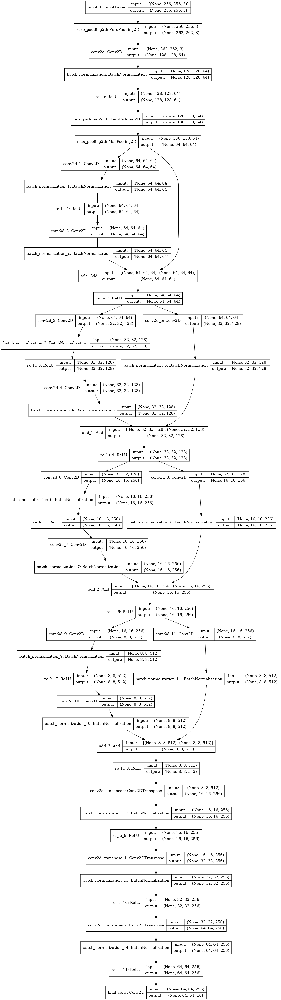

In [19]:
from tensorflow.keras.utils import plot_model  # plot_model 임포트

# 모델 구조를 'model_plot.png' 파일로 저장
plot_model(
    model,
    to_file='model_plot.png',
    show_shapes=True,       # 각 레이어의 출력 형태 표시
    show_layer_names=True,  # 각 레이어의 이름 표시
    expand_nested=True      # 중첩된 모델도 시각화
)

## 23-7. 학습 엔진 만들기

### GPU가 여러 개인 환경( `tf.distribute.MirroredStrategy`)

### 훈련 객체 만들기

In [28]:
import time
import tensorflow as tf
import math

class Trainer(object):
    def __init__(self, 
                 model, 
                 epochs, 
                 global_batch_size, 
                 strategy, 
                 initial_learning_rate):
        """
        Trainer 클래스 초기화

        Args:
            model: 학습할 딥러닝 모델
            epochs: 총 학습 에포크 수
            global_batch_size: 전체 배치 크기 (모든 GPU를 포함한 크기)
            strategy: 분산 학습 전략 객체
            initial_learning_rate: 초기 학습률
        """
        self.model = model  # 학습할 모델
        self.epochs = epochs  # 총 학습 에포크 수
        self.strategy = strategy  # 분산 학습 전략 객체
        self.global_batch_size = global_batch_size  # 전체 배치 크기
        self.loss_object = tf.keras.losses.MeanSquaredError(
            reduction=tf.keras.losses.Reduction.NONE)  # 손실 함수 정의
        self.optimizer = tf.keras.optimizers.Adam(
            learning_rate=initial_learning_rate)  # 옵티마이저 정의
        self.current_learning_rate = initial_learning_rate  # 현재 학습률
        self.last_val_loss = math.inf  # 직전 에포크의 검증 손실 (초기값: 무한대)
        self.lowest_val_loss = math.inf  # 최저 검증 손실 (초기값: 무한대)
        self.patience_count = 0  # 학습률 감소를 위한 인내 횟수
        self.max_patience = 10  # 학습률 감소를 트리거할 최대 인내 횟수
        self.best_model = None  # 최적 모델 경로 저장
        self.history = {'train_loss': [], 'val_loss': []}  # 학습 및 검증 손실 기록

    # 학습률 감소 로직 (인내 횟수 기반)
    def lr_decay(self):
        
        if self.patience_count >= self.max_patience:  # 인내 횟수가 최대치를 초과할 경우
            self.current_learning_rate /= 10.0  # 학습률 감소
            self.patience_count = 0  # 인내 횟수 초기화
        elif self.last_val_loss == self.lowest_val_loss:  # 손실이 최저치와 동일하면
            self.patience_count = 0  # 인내 횟수 초기화
        self.patience_count += 1  # 인내 횟수 증가
        self.optimizer.learning_rate = self.current_learning_rate  # 학습률 업데이트

    # 특정 에포크에서 학습률 감소
    def lr_decay_step(self, epoch):
        """   
        Args:
            epoch: 현재 에포크
        """
        if epoch == 25 or epoch == 50 or epoch == 75:  # 특정 에포크에서 학습률 감소
            self.current_learning_rate /= 10.0
        self.optimizer.learning_rate = self.current_learning_rate  # 학습률 업데이트

    # 손실 계산
    def compute_loss(self, labels, outputs):
        """        
        Args:
            labels: 실제 정답 (ground truth)
            outputs: 모델의 출력값
        Returns:
            loss: 계산된 손실 값
        """
        loss = 0.0  # 손실 초기값
        for output in outputs:  # 모델 출력에 대해 반복
            weights = tf.cast(labels > 0, dtype=tf.float32) * 81 + 1  # 가중치 계산
            loss += tf.math.reduce_mean(
                tf.math.square(labels - output) * weights) * (1. / self.global_batch_size)
        return loss  # 최종 손실 반환

    # 학습 단계 수행
    def train_step(self, inputs):
        """        
        Args:
            inputs: 입력 데이터 (이미지와 레이블)
        Returns:
            loss: 현재 배치의 학습 손실
        """
        images, labels = inputs  # 입력 데이터 분리
        with tf.GradientTape() as tape:  # 그래디언트 계산 준비
            outputs = self.model(images, training=True)  # 모델 학습
            loss = self.compute_loss(labels, outputs)  # 손실 계산

        # 그래디언트 계산 및 모델 업데이트
        grads = tape.gradient(loss, self.model.trainable_variables)
        self.optimizer.apply_gradients(zip(grads, self.model.trainable_variables))
        return loss  # 배치 손실 반환

    # 검증 단계 수행
    def val_step(self, inputs):
        """        
        Args:
            inputs: 입력 데이터 (이미지와 레이블)
        Returns:
            loss: 현재 배치의 검증 손실
        """
        images, labels = inputs  # 입력 데이터 분리
        outputs = self.model(images, training=False)  # 모델 예측
        loss = self.compute_loss(labels, outputs)  # 손실 계산
        return loss  # 배치 손실 반환

    # 전체 학습 및 검증 수행
    def run(self, train_dist_dataset, val_dist_dataset):
        """        
        Args:
            train_dist_dataset: 분산 학습 데이터셋
            val_dist_dataset: 분산 검증 데이터셋
        Returns:
            history: 학습 및 검증 손실 기록
            best_model: 최적 모델 경로
        """
        epoch_times = []  # 각 에폭 소요 시간을 저장

        @tf.function
        def distributed_train_epoch(dataset):
            """
            분산 학습 에포크 실행

            Args:
                dataset: 학습 데이터셋
            Returns:
                total_loss: 총 학습 손실
                num_train_batches: 학습 배치 수
            """
            total_loss = 0.0
            num_train_batches = 0.0
            for one_batch in dataset:
                per_replica_loss = self.strategy.run(
                    self.train_step, args=(one_batch,))  # 분산 학습 실행
                batch_loss = self.strategy.reduce(
                    tf.distribute.ReduceOp.SUM, per_replica_loss, axis=None)  # 손실 집계
                total_loss += batch_loss
                num_train_batches += 1
            return total_loss, num_train_batches

        # 분산 검증 에포크 실행
        @tf.function
        def distributed_val_epoch(dataset):
            """
            Args:
                dataset: 검증 데이터셋
            Returns:
                total_loss: 총 검증 손실
                num_val_batches: 검증 배치 수
            """
            total_loss = 0.0
            num_val_batches = 0.0
            for one_batch in dataset:
                per_replica_loss = self.strategy.run(
                    self.val_step, args=(one_batch,))  # 분산 검증 실행
                batch_loss = self.strategy.reduce(
                    tf.distribute.ReduceOp.SUM, per_replica_loss, axis=None)  # 손실 집계
                total_loss += batch_loss
                num_val_batches += 1
            return total_loss, num_val_batches

        for epoch in range(1, self.epochs + 1):
            print(f"Epoch {epoch}/{self.epochs} with learning rate {self.current_learning_rate}")
            start_time = time.time()  # 에폭 시작 시간 기록

            # 학습 수행
            train_total_loss, num_train_batches = distributed_train_epoch(train_dist_dataset)
            train_loss = train_total_loss / num_train_batches
            self.history['train_loss'].append(train_loss)

            # 검증 수행
            val_total_loss, num_val_batches = distributed_val_epoch(val_dist_dataset)
            val_loss = val_total_loss / num_val_batches
            self.history['val_loss'].append(val_loss)

            end_time = time.time()  # 에폭 종료 시간 기록
            epoch_time = end_time - start_time
            epoch_times.append(epoch_time)

            print(f"Epoch {epoch} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Time: {epoch_time:.2f}s")

            # 최적 모델 저장
            if val_loss < self.lowest_val_loss:
                self.save_model(epoch, val_loss)
                self.lowest_val_loss = val_loss

            self.last_val_loss = val_loss

        return self.history, self.best_model  # 학습 기록과 최적 모델 경로 반환

    def save_model(self, epoch, loss):
        """
        최적 모델 저장

        Args:
            epoch: 현재 에포크
            loss: 해당 에포크의 검증 손실
        """
        model_name = f'model-epoch-{epoch}-loss-{loss:.4f}.h5'
        self.model.save_weights(model_name)  # 모델 가중치 저장
        self.best_model = model_name  # 최적 모델 경로 업데이트
        print(f"Model {model_name} saved as the best model.")


### SimpleBaseline 모델용 Trainer

In [32]:
import time

class Trainer(object):
    def __init__(self, 
                 model,
                 epochs,
                 global_batch_size,
                 strategy,
                 initial_learning_rate):
        """
        Trainer 클래스 초기화

        Args:
            model: 학습할 딥러닝 모델
            epochs: 총 학습 에포크 수
            global_batch_size: 전체 배치 크기 (모든 GPU를 포함한 크기)
            strategy: 분산 학습 전략 객체
            initial_learning_rate: 초기 학습률
        """
        self.model = model
        self.epochs = epochs
        self.strategy = strategy
        self.global_batch_size = global_batch_size
        self.loss_object = tf.keras.losses.MeanSquaredError(
            reduction=tf.keras.losses.Reduction.NONE)  # 손실 함수 정의
        self.optimizer = tf.keras.optimizers.Adam(
            learning_rate=initial_learning_rate)  # 옵티마이저 정의
        self.current_learning_rate = initial_learning_rate
        self.last_val_loss = math.inf  # 직전 에포크의 검증 손실
        self.lowest_val_loss = math.inf  # 최저 검증 손실
        self.patience_count = 0  # 학습률 감소를 위한 인내 횟수
        self.max_patience = 10  # 학습률 감소를 트리거할 최대 인내 횟수
        self.best_model = None  # 최적 모델 경로 저장
        self.history = {'train_loss': [], 'val_loss': []}  # 학습 및 검증 손실 기록

    def lr_decay(self):
        """
        학습률 감소 로직 (인내 횟수 기반)

        학습이 정체될 경우 학습률을 감소시킴.
        """
        if self.patience_count >= self.max_patience:
            self.current_learning_rate /= 10.0  # 학습률 감소
            self.patience_count = 0
        elif self.last_val_loss == self.lowest_val_loss:
            self.patience_count = 0
        self.patience_count += 1
        self.optimizer.learning_rate = self.current_learning_rate  # 업데이트된 학습률 적용

    def lr_decay_step(self, epoch):
        """
        특정 에포크에서 학습률 감소

        Args:
            epoch: 현재 에포크
        """
        if epoch == 25 or epoch == 50 or epoch == 75:
            self.current_learning_rate /= 10.0  # 에포크 기반 학습률 감소
        self.optimizer.learning_rate = self.current_learning_rate  # 업데이트된 학습률 적용

    # SimpleBaseline 모델 학습 손실 계산 함수
    def compute_loss(self, labels, outputs):
        """
        SimpleBaseline 모델을 위한 학습 손실 계산 함수 (예시).

        Args:
            labels: (batch, num_joints*2) 형태의 실제 좌표값(ground truth)
            outputs: SimpleBaseline 모델의 출력값 (batch, num_joints*2) 형태라고 가정

        Returns:
            loss: 계산된 MSE 손실 값
        """
        # SimpleBaseline에서는 outputs가 list로 감싸져 있을 수 있으므로, 
        # 첫 번째 요소만 가져온다고 가정 (예: outputs[0]).
        # 만약 모델에서 단일 텐서만 리턴한다면, 바로 outputs를 사용하면 됩니다.

        # 출력이 list인 경우 (StackedHourglass처럼 여러 스택이 아니라면) 보통 outputs[0] 사용
        predictions = outputs[0] if isinstance(outputs, (list, tuple)) else outputs

        # 배치 차원 및 tensor shape을 확인해볼 수 있음 (디버깅 시):
        # print("predictions shape:", predictions.shape, "labels shape:", labels.shape)

        # MSE 손실 계산
        # (batch, num_joints*2)라는 전제에서, 각 좌표마다 (label - pred)^2 형태
        loss_per_example = tf.reduce_mean(tf.square(labels - predictions), axis=[1, 2, 3])
        loss = tf.reduce_mean(loss_per_example) * (1. / self.global_batch_size)

        return loss

    def train_step(self, inputs):
        """
        학습 단계 수행

        Args:
            inputs: 입력 데이터 (이미지와 레이블)
        Returns:
            loss: 현재 배치의 학습 손실
        """
        images, labels = inputs
        with tf.GradientTape() as tape:
            outputs = self.model(images, training=True)  # 모델 학습
            loss = self.compute_loss(labels, outputs)  # 손실 계산

        grads = tape.gradient(  # 손실에 대한 그래디언트 계산
            target=loss, sources=self.model.trainable_variables)
        self.optimizer.apply_gradients(
            zip(grads, self.model.trainable_variables))  # 그래디언트를 적용하여 모델 업데이트

        return loss

    def val_step(self, inputs):
        """
        검증 단계 수행

        Args:
            inputs: 입력 데이터 (이미지와 레이블)
        Returns:
            loss: 현재 배치의 검증 손실
        """
        images, labels = inputs
        outputs = self.model(images, training=False)  # 모델 예측 (학습 모드 아님)
        loss = self.compute_loss(labels, outputs)  # 손실 계산
        return loss

    def run(self, train_dist_dataset, val_dist_dataset):
        """
        전체 학습 및 검증 수행

        Args:
            train_dist_dataset: 분산 학습 데이터셋
            val_dist_dataset: 분산 검증 데이터셋
        Returns:
            history: 학습 및 검증 손실 기록
            best_model: 최적 모델 경로
        """
        
        epoch_times = []  # 각 에폭의 소요 시간을 저장할 리스트 (여기에서 초기화)
        
        @tf.function
        def distributed_train_epoch(dataset):
            """
            분산 학습 에포크 실행

            Args:
                dataset: 학습 데이터셋
            Returns:
                total_loss: 총 학습 손실
                num_train_batches: 학습 배치 수
            """
            total_loss = 0.0
            num_train_batches = 0.0
            for one_batch in dataset:
                per_replica_loss = self.strategy.run(
                    self.train_step, args=(one_batch,))  # 분산 학습 실행
                batch_loss = self.strategy.reduce(
                    tf.distribute.ReduceOp.SUM, per_replica_loss, axis=None)  # 손실 집계
                total_loss += batch_loss
                num_train_batches += 1
            return total_loss, num_train_batches

        @tf.function
        def distributed_val_epoch(dataset):
            """
            분산 검증 에포크 실행

            Args:
                dataset: 검증 데이터셋
            Returns:
                total_loss: 총 검증 손실
                num_val_batches: 검증 배치 수
            """
            total_loss = 0.0
            num_val_batches = 0.0
            for one_batch in dataset:
                per_replica_loss = self.strategy.run(
                    self.val_step, args=(one_batch,))  # 분산 검증 실행
                batch_loss = self.strategy.reduce(
                    tf.distribute.ReduceOp.SUM, per_replica_loss, axis=None)  # 손실 집계
                total_loss += batch_loss
                num_val_batches += 1
            return total_loss, num_val_batches

        for epoch in range(1, self.epochs + 1):
            print(f"Epoch {epoch}/{self.epochs} with learning rate {self.current_learning_rate}")
            start_time = time.time()  # 에폭 시작 시간 기록
            # 학습 수행
            train_total_loss, num_train_batches = distributed_train_epoch(train_dist_dataset)
            train_loss = train_total_loss / num_train_batches
            self.history['train_loss'].append(train_loss)

            # 검증 수행
            val_total_loss, num_val_batches = distributed_val_epoch(val_dist_dataset)
            val_loss = val_total_loss / num_val_batches
            self.history['val_loss'].append(val_loss)

            end_time = time.time()  # 에폭 종료 시간 기록
            epoch_time = end_time - start_time
            epoch_times.append(epoch_time)
            
            print(f"Epoch {epoch} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Time: {epoch_time:.2f}s")

            # 최적 모델 저장
            if val_loss < self.lowest_val_loss:
                self.save_model(epoch, val_loss)
                self.lowest_val_loss = val_loss

            self.last_val_loss = val_loss

        return self.history, self.best_model  # 학습 기록과 최적 모델 경로 반환

        
    # SimpleBaseline 모델 저장용
    def save_model(self, epoch, loss):
        """
        최적 모델 저장

        Args:
            epoch: 현재 에포크
            loss: 해당 에포크의 검증 손실
        """
        model_name = SMODEL_PATH + '/model-epoch-{}-loss-{:.4f}.h5'.format(epoch, loss)
        self.model.save_weights(model_name)  # 가중치 저장
        self.best_model = model_name  # 최적 모델 경로 업데이트
        print(f"Model {model_name} saved as the best model.")  # 저장된 모델 경로 출력    

### 데이터셋을 만드는 함수 작성

In [37]:
# 데이터셋 생성 함수 정의
# - TFRecord 파일을 로드하여 데이터셋을 생성합니다.
# - Preprocessor를 통해 전처리하고, 배치 및 Prefetch를 적용하여 효율성을 높입니다.

IMAGE_SHAPE = (256, 256, 3)  # 입력 이미지 크기
HEATMAP_SIZE = (64, 64)  # 출력 Heatmap 크기

#데이터셋 생성 함수
def create_dataset(tfrecords, batch_size, num_heatmap, is_train):
    """   
    Args:
        tfrecords: TFRecord 파일 경로 (리스트 또는 패턴)
        batch_size: 배치 크기
        num_heatmap: Heatmap 채널 수
        is_train: 학습 데이터 여부 (True: 학습용, False: 검증용)

    Returns:
        dataset: 준비된 TensorFlow 데이터셋 객체
    """
    # Preprocessor 객체 초기화
    preprocess = Preprocessor(
        IMAGE_SHAPE,  # 입력 이미지 크기
        (HEATMAP_SIZE[0], HEATMAP_SIZE[1], num_heatmap),  # Heatmap 크기
        is_train  # 학습용 데이터 여부
    )

    # TFRecord 파일 리스트 로드
    dataset = tf.data.Dataset.list_files(tfrecords)

    # TFRecordDataset으로 로드
    dataset = tf.data.TFRecordDataset(dataset)

    # Preprocessor로 데이터 전처리
    dataset = dataset.map(
        preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE)

    # 학습용 데이터일 경우 셔플 적용
    if is_train:
        dataset = dataset.shuffle(batch_size)

    # 배치 적용
    dataset = dataset.batch(batch_size)

    # Prefetch 적용 (효율성 향상)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    return dataset


In [30]:
# 학습 함수 정의
# - 주어진 설정으로 모델을 학습합니다.
# - 분산 전략을 활용해 멀티 GPU 환경에서 효율적으로 학습할 수 있도록 설계되었습니다.

# 모델 학습 함수
def train(epochs, learning_rate, num_heatmap, batch_size, train_tfrecords, val_tfrecords):
    """    
    Args:
        epochs: 총 학습 에포크 수
        learning_rate: 초기 학습률
        num_heatmap: Heatmap 채널 수
        batch_size: 각 장치(GPU)에서의 배치 크기
        train_tfrecords: 학습 TFRecord 파일 경로
        val_tfrecords: 검증 TFRecord 파일 경로

    Returns:
        학습 및 검증 기록
    """
    # 분산 학습 전략 정의 (멀티 GPU 환경)
    strategy = tf.distribute.MirroredStrategy()
    global_batch_size = strategy.num_replicas_in_sync * batch_size  # 전체 배치 크기 계산

    # 학습 및 검증 데이터셋 생성
    train_dataset = create_dataset(
        train_tfrecords, global_batch_size, num_heatmap, is_train=True)
    val_dataset = create_dataset(
        val_tfrecords, global_batch_size, num_heatmap, is_train=False)

    # 모델 저장 경로 생성
    if not os.path.exists(MODEL_PATH):
        os.makedirs(MODEL_PATH)

    # 분산 학습 환경에서 모델 및 Trainer 초기화
    with strategy.scope():
        # 분산 데이터셋 생성
        train_dist_dataset = strategy.experimental_distribute_dataset(train_dataset)
        val_dist_dataset = strategy.experimental_distribute_dataset(val_dataset)

        # 모델 생성
        model = StackedHourglassNetwork(IMAGE_SHAPE, num_stack=4, num_residual=1, num_heatmap=num_heatmap)

        # Trainer 객체 생성
        trainer = Trainer(
            model=model,
            epochs=epochs,
            global_batch_size=global_batch_size,
            strategy=strategy,
            initial_learning_rate=learning_rate)

        # 학습 시작
        print('Start training...')
        return trainer.run(train_dist_dataset, val_dist_dataset)



### SimpleBaseline 모델용 Train

In [34]:
def train(epochs, learning_rate, num_heatmap, batch_size, train_tfrecords, val_tfrecords):
    """
    분산 전략을 통한 학습을 진행하는 함수.
    SimpleBaseline 모델 또는 StackedHourglassNetwork 모델 중 하나를 선택해 학습을 수행.
    """

    # MirroredStrategy를 사용하여 여러 GPU에 걸친 분산 학습을 지원합니다.
    strategy = tf.distribute.MirroredStrategy()
    
    # 각 GPU마다 배치가 나뉘어 처리되므로, 전체 배치 크기를 GPU 수에 맞춰 곱해줍니다.
    global_batch_size = strategy.num_replicas_in_sync * batch_size

    # TFRecord 파일로부터 학습용/검증용 데이터셋을 생성합니다.
    train_dataset = create_dataset(
        train_tfrecords, global_batch_size, num_heatmap, is_train=True)
    val_dataset = create_dataset(
        val_tfrecords, global_batch_size, num_heatmap, is_train=False)

    # 모델 저장 경로가 존재하지 않을 경우 디렉토리를 생성합니다.
    if not os.path.exists(SMODEL_PATH):
        os.makedirs(SMODEL_PATH)

    with strategy.scope():
        """
        아래 블록 내부에서는 분산 스코프가 적용되어,
        모델과 옵티마이저가 동일한 스코프에서 생성됩니다.
        """

        # 학습용/검증용 데이터셋을 분산 처리할 수 있도록 변환합니다.
        train_dist_dataset = strategy.experimental_distribute_dataset(train_dataset)
        val_dist_dataset = strategy.experimental_distribute_dataset(val_dataset)

        # SimpleBaseline 모델로 학습을 진행할 경우, 해당 모델을 사용합니다.
        model = Simplebaseline(input_shape=(256, 256, 3))

        # Trainer 클래스를 통해 모델, 옵티마이저, 손실 함수 등을 관리하며 학습합니다.
        # epochs, batch_size, learning_rate 등 하이퍼파라미터는 필요에 맞춰 수정하세요.
        trainer = Trainer(
            model=model,
            epochs=epochs,
            global_batch_size=strategy.num_replicas_in_sync * 32,
            strategy=strategy,
            initial_learning_rate=0.0007
        )

        print('Start training...')
        # 분산 학습용 데이터셋을 입력하여 학습을 수행하고, 최적 모델 경로 등을 반환합니다.
        return trainer.run(train_dist_dataset, val_dist_dataset)




### 기존모델 불러오기

In [52]:
import os
import glob

# 저장된 최적 모델 탐색 함수
def find_best_model(model_dir):
    """
    모델 디렉토리에서 가장 낮은 손실 값을 가진 모델 파일을 찾는 함수

    Args:
        model_dir (str): 모델이 저장된 디렉토리 경로

    Returns:
        str: 최적 모델 파일 경로
    """
    model_files = glob.glob(os.path.join(model_dir, "model-epoch-*-loss-*.h5"))
    if not model_files:
        raise FileNotFoundError(f"No model files found in {model_dir}")

    # 손실 값 추출 및 정렬
    def extract_loss(file_name):
        loss_str = file_name.split("-loss-")[-1].replace(".h5", "")
        return float(loss_str)

    best_model_file = min(model_files, key=extract_loss)
    return best_model_file

# 최적 모델 파일 탐색
MODEL_PATH = "/aiffel/aiffel/mpii/model"

# hourglass는 "MODEL_PATH "사용
# SimpleBaseline 모델은 "SMODEL_PATH" 사용

best_model_path = find_best_model(SMODEL_PATH)

# model = StackedHourglassNetwork(IMAGE_SHAPE, 4, 1)
# model.load_weights(WEIGHTS_PATH)

# # 이전의 학습하는 코드 블럭을 통해 학습하고 그 모델을 사용할 경우 아래 주석 처리된 코드를 사용하면 됩니다
# # model.load_weights(best_model_file)

In [59]:
# 저장된 최적 모델 파일 경로
# 학습 시 저장된 최적의 모델 경로를 지정합니다.
# model = StackedHourglassNetwork(IMAGE_SHAPE, 4, 1)

best_model_path = find_best_model(SMODEL_PATH)  # find_best_model 함수로 탐색한 최적 모델 파일 경로

# 저장된 모델 가중치 로드
if os.path.exists(best_model_path):  # 모델 파일이 존재하는지 확인
    model.load_weights(best_model_path)  # 가중치 로드
    print(f"모델이 성공적으로 로드되었습니다: {best_model_path}")  # 로드된 모델 파일 이름 출력
else:
    raise FileNotFoundError(f"모델 파일이 존재하지 않습니다: {best_model_path}")
best_model_path = find_best_model(MODEL_PATH)



모델이 성공적으로 로드되었습니다: /aiffel/aiffel/mpii/smodel/model-epoch-15-loss-0.0025.h5


### SimpleBaseline Best 모델 불러오기

In [76]:
# 저장된 최적 모델 파일 경로
# 학습 시 저장된 최적의 모델 경로를 지정합니다.
best_model_path = find_best_model(SMODEL_PATH)  # find_best_model 함수로 탐색한 최적 모델 파일 경로

# 저장된 모델 가중치 로드
if os.path.exists(best_model_path):  # 모델 파일이 존재하는지 확인
    model.load_weights(best_model_path)  # 가중치 로드
    print(f"모델이 성공적으로 로드되었습니다: {best_model_path}")  # 로드된 모델 파일 이름 출력
else:
    raise FileNotFoundError(f"모델 파일이 존재하지 않습니다: {best_model_path}")

모델이 성공적으로 로드되었습니다: /aiffel/aiffel/mpii/smodel/model-epoch-1-loss-0.0032.h5


### 모델학습

In [40]:
train_tfrecords = os.path.join(TFRECORD_PATH, 'train*')
val_tfrecords = os.path.join(TFRECORD_PATH, 'val*')
epochs = 30
batch_size = 16
num_heatmap = 16
learning_rate = 0.0007

# 1. 학습 함수 호출
history, best_model_path = train(
    epochs,
    learning_rate,
    num_heatmap,
    batch_size,
    train_tfrecords,
    val_tfrecords
)

# 2. 학습 결과 확인
print("History:", history)
print("Best model path:", best_model_path)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/

/opt/conda/lib/python3.9/site-packages/tensorflow/python/data/ops/dataset_ops.py:374: UserWarning: To make it possible to preserve tf.data options across serialization boundaries, their implementation has moved to be part of the TensorFlow graph. As a consequence, the options value is in general no longer known at graph construction time. Invoking this method in graph mode retains the legacy behavior of the original implementation, but note that the returned value might not reflect the actual value of the options.
  warnings.warn("To make it possible to preserve tf.data options across "


Epoch 1 - Train Loss: 0.0033, Val Loss: 0.0032, Time: 743.20s
Model /aiffel/aiffel/mpii/smodel/model-epoch-1-loss-0.0032.h5 saved as the best model.
Epoch 2/30 with learning rate 0.0007
Epoch 2 - Train Loss: 0.0031, Val Loss: 0.0030, Time: 699.35s
Model /aiffel/aiffel/mpii/smodel/model-epoch-2-loss-0.0030.h5 saved as the best model.
Epoch 3/30 with learning rate 0.0007
Epoch 3 - Train Loss: 0.0029, Val Loss: 0.0029, Time: 700.49s
Model /aiffel/aiffel/mpii/smodel/model-epoch-3-loss-0.0029.h5 saved as the best model.
Epoch 4/30 with learning rate 0.0007
Epoch 4 - Train Loss: 0.0028, Val Loss: 0.0027, Time: 706.64s
Model /aiffel/aiffel/mpii/smodel/model-epoch-4-loss-0.0027.h5 saved as the best model.
Epoch 5/30 with learning rate 0.0007
Epoch 5 - Train Loss: 0.0027, Val Loss: 0.0027, Time: 686.07s
Model /aiffel/aiffel/mpii/smodel/model-epoch-5-loss-0.0027.h5 saved as the best model.
Epoch 6/30 with learning rate 0.0007
Epoch 6 - Train Loss: 0.0026, Val Loss: 0.0026, Time: 706.41s
Model /a

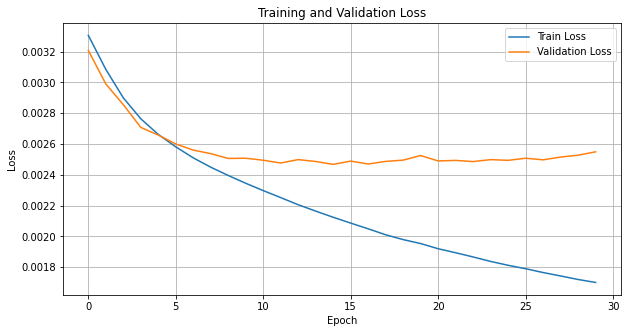

The best model is saved at: /aiffel/aiffel/mpii/smodel/model-epoch-15-loss-0.0025.h5


In [41]:
# 학습 및 검증 손실 시각화
plt.figure(figsize=(10, 5))
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

print(f"The best model is saved at: {best_model_path}")

####  Stacked Hourglass Network 학습결과(30 epochs)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
Start training...

Epoch 1/30 with learning rate 0.0007

/opt/conda/lib/python3.9/site-packages/tensorflow/python/data/ops/dataset_ops.py:374: UserWarning: To make it possible to preserve tf.data options across serialization boundaries, their implementation has moved to be part of the TensorFlow graph. As a consequence, the options value is in general no longer known at graph construction time. Invoking this method in graph mode retains the legacy behavior of the original implementation, but note that the returned value might not reflect the actual value of the options.
  warnings.warn("To make it possible to preserve tf.data options across "
  
  
Epoch 1 - Train Loss: 1.5412, Val Loss: 1.4291, Time: 1407.62s
Model /aiffel/aiffel/mpii/model/model-epoch-1-loss-1.4291.h5 saved as the best model.

Epoch 2/30 with learning rate 0.0007
Epoch 2 - Train Loss: 1.3621, Val Loss: 1.3156, Time: 1273.65s
Model /aiffel/aiffel/mpii/model/model-epoch-2-loss-1.3156.h5 saved as the best model.

Epoch 3/30 with learning rate 0.0007
Epoch 3 - Train Loss: 1.2745, Val Loss: 1.2837, Time: 1270.67s
Model /aiffel/aiffel/mpii/model/model-epoch-3-loss-1.2837.h5 saved as the best model.

Epoch 4/30 with learning rate 0.0007
Epoch 4 - Train Loss: 1.2208, Val Loss: 1.2050, Time: 1266.02s
Model /aiffel/aiffel/mpii/model/model-epoch-4-loss-1.2050.h5 saved as the best model.

Epoch 5/30 with learning rate 0.0007
Epoch 5 - Train Loss: 1.1827, Val Loss: 1.1975, Time: 1264.61s
Model /aiffel/aiffel/mpii/model/model-epoch-5-loss-1.1975.h5 saved as the best model.

Epoch 6/30 with learning rate 0.0007
Epoch 6 - Train Loss: 1.1496, Val Loss: 1.1683, Time: 1267.72s
Model /aiffel/aiffel/mpii/model/model-epoch-6-loss-1.1683.h5 saved as the best model.

Epoch 7/30 with learning rate 0.0007
Epoch 7 - Train Loss: 1.1259, Val Loss: 1.1561, Time: 1312.02s
Model /aiffel/aiffel/mpii/model/model-epoch-7-loss-1.1561.h5 saved as the best model.

Epoch 8/30 with learning rate 0.0007
Epoch 8 - Train Loss: 1.1049, Val Loss: 1.1216, Time: 1310.45s
Model /aiffel/aiffel/mpii/model/model-epoch-8-loss-1.1216.h5 saved as the best model.

Epoch 9/30 with learning rate 0.0007
Epoch 9 - Train Loss: 1.0835, Val Loss: 1.1345, Time: 1312.17s

Epoch 10/30 with learning rate 0.0007
Epoch 10 - Train Loss: 1.0669, Val Loss: 1.1269, Time: 1313.26s

Epoch 11/30 with learning rate 0.0007
Epoch 11 - Train Loss: 1.0505, Val Loss: 1.1383, Time: 1265.80s

Epoch 12/30 with learning rate 0.0007
Epoch 12 - Train Loss: 1.0372, Val Loss: 1.1076, Time: 1310.73s
Model /aiffel/aiffel/mpii/model/model-epoch-12-loss-1.1076.h5 saved as the best model.

Epoch 13/30 with learning rate 0.0007
Epoch 13 - Train Loss: 1.0229, Val Loss: 1.1030, Time: 1264.66s
Model /aiffel/aiffel/mpii/model/model-epoch-13-loss-1.1030.h5 saved as the best model.

Epoch 14/30 with learning rate 0.0007
Epoch 14 - Train Loss: 1.0092, Val Loss: 1.1132, Time: 1265.31s

Epoch 15/30 with learning rate 0.0007
Epoch 15 - Train Loss: 0.9967, Val Loss: 1.1157, Time: 1268.34s

Epoch 16/30 with learning rate 0.0007
Epoch 16 - Train Loss: 0.9837, Val Loss: 1.1183, Time: 1265.21s

Epoch 17/30 with learning rate 0.0007
Epoch 17 - Train Loss: 0.9739, Val Loss: 1.0982, Time: 1268.85s
Model /aiffel/aiffel/mpii/model/model-epoch-17-loss-1.0982.h5 saved as the best model.

Epoch 18/30 with learning rate 0.0007
Epoch 18 - Train Loss: 0.9591, Val Loss: 1.1006, Time: 1312.49s

Epoch 19/30 with learning rate 0.0007
Epoch 19 - Train Loss: 0.9490, Val Loss: 1.1186, Time: 1265.06s

Epoch 20/30 with learning rate 0.0007
Epoch 20 - Train Loss: 0.9392, Val Loss: 1.1053, Time: 1311.29s

Epoch 21/30 with learning rate 0.0007
Epoch 21 - Train Loss: 0.9291, Val Loss: 1.1343, Time: 1264.39s

Epoch 22/30 with learning rate 0.0007
Epoch 22 - Train Loss: 0.9184, Val Loss: 1.1563, Time: 1265.28s

Epoch 23/30 with learning rate 0.0007
Epoch 23 - Train Loss: 0.9100, Val Loss: 1.1143, Time: 1313.52s

Epoch 24/30 with learning rate 0.0007
Epoch 24 - Train Loss: 0.9011, Val Loss: 1.1283, Time: 1262.30s

Epoch 25/30 with learning rate 0.0007
Epoch 25 - Train Loss: 0.8904, Val Loss: 1.1328, Time: 1312.88s

Epoch 26/30 with learning rate 0.0007
Epoch 26 - Train Loss: 0.8821, Val Loss: 1.1316, Time: 1262.29s

Epoch 27/30 with learning rate 0.0007
Epoch 27 - Train Loss: 0.8753, Val Loss: 1.1455, Time: 1263.74s

Epoch 28/30 with learning rate 0.0007
Epoch 28 - Train Loss: 0.8646, Val Loss: 1.1367, Time: 1270.95s


Epoch 29/30 with learning rate 0.0007
Epoch 29 - Train Loss: 0.8583, Val Loss: 1.1517, Time: 1261.07s

Epoch 30/30 with learning rate 0.0007
Epoch 30 - Train Loss: 0.8493, Val Loss: 1.1463, Time: 1262.30s

History: {'train_loss': [<tf.Tensor: shape=(), dtype=float32, numpy=1.5412277>, <tf.Tensor: shape=(), dtype=float32, numpy=1.3621156>, <tf.Tensor: shape=(), dtype=float32, numpy=1.2745279>, <tf.Tensor: shape=(), dtype=float32, numpy=1.2207924>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1827329>, <tf.Tensor: shape=(), dtype=float32, numpy=1.149614>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1258956>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1049204>, <tf.Tensor: shape=(), dtype=float32, numpy=1.0835023>, <tf.Tensor: shape=(), dtype=float32, numpy=1.066895>, <tf.Tensor: shape=(), dtype=float32, numpy=1.0505284>, <tf.Tensor: shape=(), dtype=float32, numpy=1.037177>, <tf.Tensor: shape=(), dtype=float32, numpy=1.0228916>, <tf.Tensor: shape=(), dtype=float32, numpy=1.009224>, <tf.Tensor: shape=(), dtype=float32, numpy=0.99670726>, <tf.Tensor: shape=(), dtype=float32, numpy=0.98369044>, <tf.Tensor: shape=(), dtype=float32, numpy=0.9738877>, <tf.Tensor: shape=(), dtype=float32, numpy=0.95908666>, <tf.Tensor: shape=(), dtype=float32, numpy=0.9489746>, <tf.Tensor: shape=(), dtype=float32, numpy=0.9392282>, <tf.Tensor: shape=(), dtype=float32, numpy=0.92905146>, <tf.Tensor: shape=(), dtype=float32, numpy=0.91836894>, <tf.Tensor: shape=(), dtype=float32, numpy=0.91004324>, <tf.Tensor: shape=(), dtype=float32, numpy=0.9010701>, <tf.Tensor: shape=(), dtype=float32, numpy=0.89040226>, <tf.Tensor: shape=(), dtype=float32, numpy=0.8820567>, <tf.Tensor: shape=(), dtype=float32, numpy=0.87527287>, <tf.Tensor: shape=(), dtype=float32, numpy=0.8645654>, <tf.Tensor: shape=(), dtype=float32, numpy=0.8583013>, <tf.Tensor: shape=(), dtype=float32, numpy=0.849307>], 'val_loss': [<tf.Tensor: shape=(), dtype=float32, numpy=1.4291347>, <tf.Tensor: shape=(), dtype=float32, numpy=1.315625>, <tf.Tensor: shape=(), dtype=float32, numpy=1.2836815>, <tf.Tensor: shape=(), dtype=float32, numpy=1.2050157>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1975081>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1682743>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1561162>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1215544>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1345083>, <tf.Tensor: shape=(), dtype=float32, numpy=1.126928>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1382785>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1076388>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1030142>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1132203>, <tf.Tensor: shape=(), dtype=float32, numpy=1.115674>, <tf.Tensor: shape=(), dtype=float32, numpy=1.11825>, <tf.Tensor: shape=(), dtype=float32, numpy=1.0981988>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1005875>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1186305>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1052654>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1342566>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1562991>, <tf.Tensor: shape=(), dtype=float32, numpy=1.114308>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1283376>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1327974>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1315837>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1454834>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1367409>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1517279>, <tf.Tensor: shape=(), dtype=float32, numpy=1.1463082>]}
Best model path: /aiffel/aiffel/mpii/model/model-epoch-17-loss-1.0982.h5

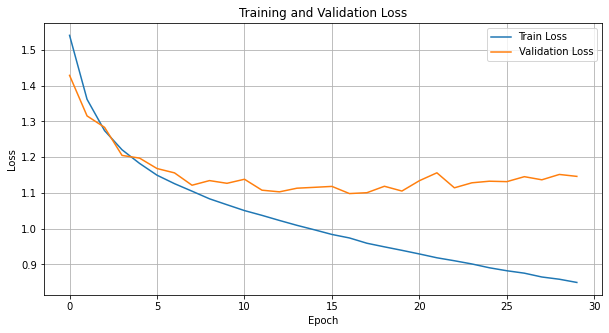

### 예측 엔진 만들기

이제 학습이 끝난 모델이 얼마나 잘 예측하는지 확인

In [ ]:
# WEIGHTS_PATH = os.path.join(PROJECT_PATH, 'models', 'model-v0.0.1-epoch-2-loss-1.3072.h5')

# model = StackedHourglassNetwork(IMAGE_SHAPE, 4, 1)
# model.load_weights(WEIGHTS_PATH)

# # 이전의 학습하는 코드 블럭을 통해 학습하고 그 모델을 사용할 경우 아래 주석 처리된 코드를 사용하면 됩니다
# # model.load_weights(best_model_file)

In [44]:
# MPII 키포인트 정의
# - MPII 데이터셋의 키포인트와 해당 연결을 정의합니다.

# 각 키포인트에 대한 인덱스 정의
R_ANKLE = 0       # 오른쪽 발목
R_KNEE = 1        # 오른쪽 무릎
R_HIP = 2         # 오른쪽 엉덩이
L_HIP = 3         # 왼쪽 엉덩이
L_KNEE = 4        # 왼쪽 무릎
L_ANKLE = 5       # 왼쪽 발목
PELVIS = 6        # 골반
THORAX = 7        # 가슴
UPPER_NECK = 8    # 목 윗부분
HEAD_TOP = 9      # 머리 꼭대기
R_WRIST = 10      # 오른쪽 손목
R_ELBOW = 11      # 오른쪽 팔꿈치
R_SHOULDER = 12   # 오른쪽 어깨
L_SHOULDER = 13   # 왼쪽 어깨
L_ELBOW = 14      # 왼쪽 팔꿈치
L_WRIST = 15      # 왼쪽 손목

# 키포인트 연결 (뼈대 구조) 정의
MPII_BONES = [
    [R_ANKLE, R_KNEE],       # 오른쪽 발목 -> 오른쪽 무릎
    [R_KNEE, R_HIP],         # 오른쪽 무릎 -> 오른쪽 엉덩이
    [R_HIP, PELVIS],         # 오른쪽 엉덩이 -> 골반
    [L_HIP, PELVIS],         # 왼쪽 엉덩이 -> 골반
    [L_HIP, L_KNEE],         # 왼쪽 엉덩이 -> 왼쪽 무릎
    [L_KNEE, L_ANKLE],       # 왼쪽 무릎 -> 왼쪽 발목
    [PELVIS, THORAX],        # 골반 -> 가슴
    [THORAX, UPPER_NECK],    # 가슴 -> 목 윗부분
    [UPPER_NECK, HEAD_TOP],  # 목 윗부분 -> 머리 꼭대기
    [R_WRIST, R_ELBOW],      # 오른쪽 손목 -> 오른쪽 팔꿈치
    [R_ELBOW, R_SHOULDER],   # 오른쪽 팔꿈치 -> 오른쪽 어깨
    [THORAX, R_SHOULDER],    # 가슴 -> 오른쪽 어깨
    [THORAX, L_SHOULDER],    # 가슴 -> 왼쪽 어깨
    [L_SHOULDER, L_ELBOW],   # 왼쪽 어깨 -> 왼쪽 팔꿈치
    [L_ELBOW, L_WRIST]       # 왼쪽 팔꿈치 -> 왼쪽 손목
]




In [45]:
# 최대 좌표 찾기 함수 정의
# - Heatmap에서 최대값(가장 높은 확률)을 가지는 좌표를 찾습니다.


def find_max_coordinates(heatmaps):
    """   
    Args:
        heatmaps (tf.Tensor): 입력 Heatmap 텐서, 크기 (64, 64, 16).

    Returns:
        numpy.ndarray: 최대값의 (x, y) 좌표, 크기 (16, 2).
    """
    # Heatmap을 평탄화하여 각 채널(16개의 키포인트)을 처리
    flatten_heatmaps = tf.reshape(heatmaps, (-1, 16))  # 크기 (64*64, 16)

    # 각 키포인트 채널에서 최대값의 인덱스를 찾음
    indices = tf.math.argmax(flatten_heatmaps, axis=0)  # 크기 (16,)

    # 인덱스를 (x, y) 좌표로 변환
    y = tf.cast(indices / 64, dtype=tf.int64)  # 행(y 좌표) 계산
    x = indices - 64 * y  # 열(x 좌표) 계산

    # (x, y) 좌표를 스택으로 결합하여 반환
    return tf.stack([x, y], axis=1).numpy()  # 크기 (16, 2)


In [46]:
# Heatmap에서 키포인트 좌표 추출 및 보정
# - 최대값 좌표를 기반으로 정밀한 키포인트 좌표를 계산합니다.

def extract_keypoints_from_heatmap(heatmaps):
    """   
    Args:
        heatmaps (numpy.ndarray): 크기 (64, 64, 16)의 Heatmap 배열.

    Returns:
        numpy.ndarray: 정규화된 키포인트 좌표 (크기 16x2).
    """
    # 1. Heatmap에서 최대값 좌표 추출
    max_keypoints = find_max_coordinates(heatmaps)  # 크기 (16, 2)

    # 2. Heatmap을 패딩 처리 (경계 처리 용이)
    padded_heatmap = np.pad(heatmaps, [[1, 1], [1, 1], [0, 0]], mode='constant')

    adjusted_keypoints = []  # 보정된 키포인트 저장 리스트

    # 3. 각 키포인트에 대해 보정 계산
    for i, keypoint in enumerate(max_keypoints):
        max_y = keypoint[1] + 1  # 패딩된 Heatmap에서의 y 좌표
        max_x = keypoint[0] + 1  # 패딩된 Heatmap에서의 x 좌표

        # 3x3 패치 추출
        patch = padded_heatmap[max_y-1:max_y+2, max_x-1:max_x+2, i]  # 주변 3x3 영역
        patch[1][1] = 0  # 중심값 제거 (다른 방향 탐색)

        # 가장 큰 값의 위치 찾기
        index = np.argmax(patch)
        next_y = index // 3  # 3x3 패치에서 y 좌표
        next_x = index - next_y * 3  # 3x3 패치에서 x 좌표

        # 이동량 계산
        delta_y = (next_y - 1) / 4  # y 방향 미세 보정
        delta_x = (next_x - 1) / 4  # x 방향 미세 보정

        # 보정된 키포인트 계산
        adjusted_keypoint_x = keypoint[0] + delta_x
        adjusted_keypoint_y = keypoint[1] + delta_y
        adjusted_keypoints.append((adjusted_keypoint_x, adjusted_keypoint_y))

    # 4. 키포인트 좌표 클리핑 (64x64 범위 제한)
    adjusted_keypoints = np.clip(adjusted_keypoints, 0, 64)

    # 5. 좌표를 64로 나눠 정규화
    normalized_keypoints = np.array(adjusted_keypoints) / 64

    return normalized_keypoints  # 크기 (16, 2)


In [47]:
# 모델 예측 함수 정의
# - 주어진 이미지 경로로부터 이미지를 로드하고 모델을 통해 키포인트를 예측합니다.

def predict(model, image_path):
    """    
    Args:
        model (tf.keras.Model): 학습된 딥러닝 모델.
        image_path (str): 입력 이미지 경로.

    Returns:
        tf.Tensor: 원본 이미지.
        numpy.ndarray: 예측된 키포인트 좌표 (정규화된 값, 크기 16x2).
    """
    # 1. 이미지 로드 및 디코딩
    encoded = tf.io.read_file(image_path)  # 이미지 파일 읽기
    image = tf.io.decode_jpeg(encoded)  # JPEG 이미지 디코딩

    # 2. 이미지 전처리
    inputs = tf.image.resize(image, (256, 256))  # 이미지 크기 조정
    inputs = tf.cast(inputs, tf.float32) / 127.5 - 1  # 정규화
    inputs = tf.expand_dims(inputs, 0)  # 배치 차원 추가

    # 3. 모델 예측
    outputs = model(inputs, training=False)  # 모델 추론
    if type(outputs) != list:  # 출력이 리스트가 아닌 경우 리스트로 변환
        outputs = [outputs]

    # 4. Heatmap에서 키포인트 추출
    heatmap = tf.squeeze(outputs[-1], axis=0).numpy()  # 마지막 출력 Heatmap 선택
    kp = extract_keypoints_from_heatmap(heatmap)  # 키포인트 좌표 추출

    # 5. 원본 이미지와 키포인트 반환
    return image, kp

In [48]:
# 키포인트 시각화 함수 정의
# - 이미지 위에 예측된 키포인트 및 뼈대를 그립니다.


# 이미지 위에 키포인트를 시각화.
def draw_keypoints_on_image(image, keypoints, index=None):
    """    
    Args:
        image (numpy.ndarray): 원본 이미지.
        keypoints (numpy.ndarray): 정규화된 키포인트 좌표 (크기 16x2).
        index (int, optional): 특정 키포인트만 표시하려면 인덱스 지정. None이면 모든 키포인트 표시.
    """
    fig, ax = plt.subplots(1)
    ax.imshow(image)  # 이미지 출력

    # 각 키포인트를 이미지 크기에 맞게 변환 후 그리기
    for i, joint in enumerate(keypoints):
        joint_x = joint[0] * image.shape[1]  # x 좌표 변환
        joint_y = joint[1] * image.shape[0]  # y 좌표 변환
        if index is not None and index != i:  # 특정 키포인트만 표시
            continue
        plt.scatter(joint_x, joint_y, s=10, c='red', marker='o')  # 키포인트 표시

    plt.show()

    
# 이미지 위에 뼈대(키포인트 연결)를 시각화.    
def draw_skeleton_on_image(image, keypoints, index=None):
    """   
    Args:
        image (numpy.ndarray): 원본 이미지.
        keypoints (numpy.ndarray): 정규화된 키포인트 좌표 (크기 16x2).
        index (int, optional): 특정 키포인트만 포함된 뼈대 표시. None이면 전체 표시.
    """
    fig, ax = plt.subplots(1)
    ax.imshow(image)  # 이미지 출력

    joints = []
    # 각 키포인트를 이미지 크기에 맞게 변환
    for i, joint in enumerate(keypoints):
        joint_x = joint[0] * image.shape[1]  # x 좌표 변환
        joint_y = joint[1] * image.shape[0]  # y 좌표 변환
        joints.append((joint_x, joint_y))  # 변환된 좌표 추가

    # 각 뼈대를 연결하여 그리기
    for bone in MPII_BONES:
        joint_1 = joints[bone[0]]  # 첫 번째 키포인트
        joint_2 = joints[bone[1]]  # 두 번째 키포인트
        plt.plot(
            [joint_1[0], joint_2[0]],  # x 좌표 연결
            [joint_1[1], joint_2[1]],  # y 좌표 연결
            linewidth=5, alpha=0.7  # 선 스타일
        )

    plt.show()


In [ ]:
# 테스트 이미지 경로 설정
test_image = os.path.join(PROJECT_PATH, 'test_image.jpg') 

# 모델 예측 수행
image, keypoints = predict(model, test_image)  

# 키포인트 시각화
draw_keypoints_on_image(image, keypoints) 

# 뼈대 시각화
draw_skeleton_on_image(image, keypoints)  


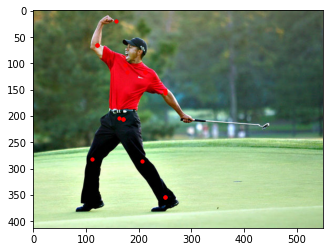
####  Stacked Hourglass Network best : model-epoch-17-loss-1.0982.h5

추가 참고

자 이제 테스트 이미지를 이용해 모델의 성능을 확인해 봅시다.


저장 된 가중치 모델
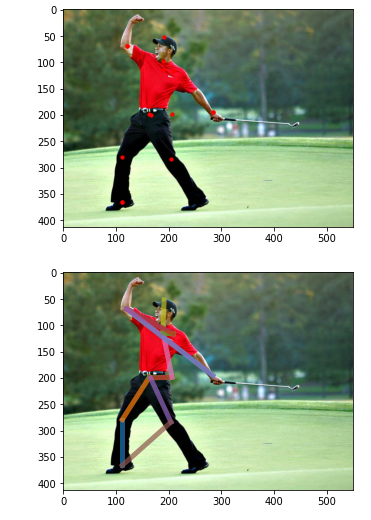


타이거 우즈 축하 폭죽 사진을 얻었다!(1에폭)
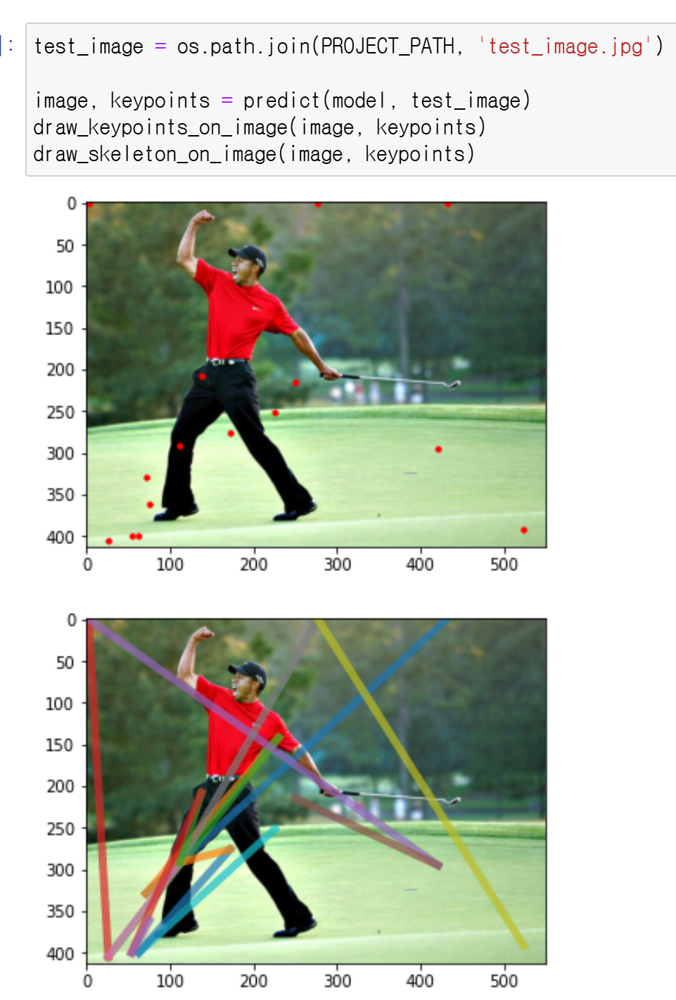


6에폭 학습 후 많이 좋아지
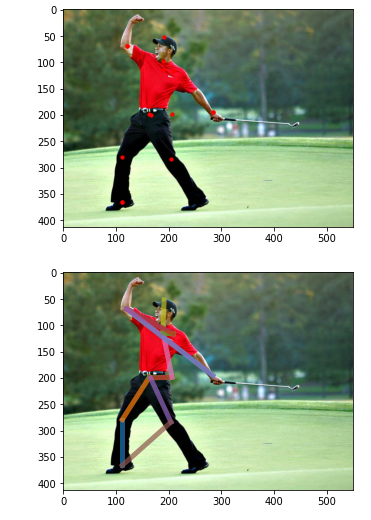

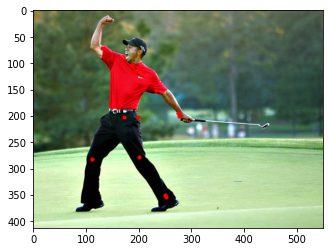

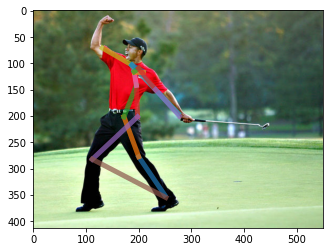

In [54]:
# simplebaseline best: epoch-15-loss-0.0025

# 테스트 이미지 경로 설정
test_image = os.path.join(PROJECT_PATH, 'test_image.jpg') 

# 모델 예측 수행
image, keypoints = predict(model, test_image)  

# 키포인트 시각화
draw_keypoints_on_image(image, keypoints) 

# 뼈대 시각화
draw_skeleton_on_image(image, keypoints)  


#### simplebaseline best: epoch-15-loss-0.0025



## 회고
1. 두개의 모델을 30에폭 학습을 진행하였고, 두개의 모델 모두 과적합에 이른것으로 보인다.
2. 모션인식 결과를 비교하였으나, 둘다 만족스럽지 못하였다.
3. Stacked Hourglass Network는 에폭 학습에 약 1300s
4. simplebaseline은 에폭 학습에 약 700s
5. simplebaseline이 학습시간 대비 가성비가 좋다
6. 이번에는 다양한 실험 보다는 코드를 이해하고 코드와 모델을 비교하며 학습하는데 중점을 두었었습니다.
7. 다른 지표들을 통하여 평가를 진행해보고 싶었지만 진행하지 못했다.
8. 추후 시간이 된다면 모델 성능개선과 다양한 지표를 통한 평가를 진행해보면 좋을 것 같다.